# Processing of MTBLS1198 Seaomics dataset volume dataset
https://www.ebi.ac.uk/metabolights/editor/MTBLS1198/descriptors
https://acp.copernicus.org/preprints/acp-2019-852/acp-2019-852.pdf

Software: Tidy-Direct-to-MS
Dataset: MTBLS1198

Execute the following commands first in an Anaconda terminal, then the notebook can be compiled

-  navigate to a new folder
```
mkdir Seaomics_MTBLS1198
cd Seaomics_MTBLS1198
```
- create and activate conda environment
```
conda create --name test123 python=3.10
conda activate test123
```

- install tidyms with the Tidy-Diret-to-MS module and other packages
```
pip install git+https://github.com/griquelme/tidyms
pip install jupyter lxml tabulate
```

- download example dataset
```
git clone https://github.com/christophuv/MTBLS1198_SeaOmics_DATA.git
```

- download jupyter file
Download the following file and save it to the above created folder
https://github.com/griquelme/tidyms/blob/master/docs/examples/DARTMS_MTBLS1198_SeaOmics__processing.ipynb

- run notebook
```
jupyter nbconvert DARTMS_MTBLS1198_SeaOmics__processing.ipynb --to html
```

In [3]:
## Setup

########################################
## Packages

## Import tidyMS
## Since it is not yet packed, load it from the development directory
import sys

import tidyms as ms

import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)

import plotnine as p9
import numpy as np
import pandas as pd
import natsort

import os
import shutil
import functools
import time

import logging

logging.basicConfig(level=logging.INFO)


########################################
## Common parameters

p9.options.figure_size = (20, 12)


########################################
## Functions and others


## Object to record processing times
## useage with RecordExecutionTime():
##     code...
class RecordExecutionTime(object):
    def __init__(self, name=None):
        self.name = name
        self.start = None

    def __enter__(self):
        self.startTime = time.perf_counter()

    def __exit__(self, *args):
        duration = time.perf_counter() - self.startTime
        unit = "seconds"
        if duration > 60 * 60:
            duration = duration / 60 / 60
            unit = "hours"
        elif duration > 60:
            duration = duration / 60
            unit = "minutes"
        elif duration > 0:
            pass
        elif duration > 1 / 1e3:
            duration = duration * 1e3
            unit = "milli-seconds"
        elif duration > 1 / 1e6:
            duration = duration * 1e6
        logging.info(".. took %.1f %s to execute" % (duration, unit))


Loading BokehJS ...

## Specify the data to be loaded

In [4]:
## Specify the data to load

discriminantFeaturesTable1 = [258.1835, 275.1652, 455.4106, 512.2138, 557.4069, 639.4312, 653.5088, 667.5346, 675.4587, 751.6276, 795.7092]

path = "./MTBLS1198_SeaOmics_DATA/"
ms_mode = "centroid"
instrument = "qtof"
filenames = natsort.natsorted([os.path.join(path, file) for file in os.listdir(path) if file.endswith(".mzML") and not "_rtShifted.mzML" in file])
spotFile = "./MTBLS1198_SeaOmics_DATA/defined_spots.tsv"
temp_file = "./MTBLS1198_SeaOmics_DATA/temp_assay.dill"

## necessary step to replace \r\n with only \n
for filename in filenames:
    lines = None
    with open(filename, "r") as fin:
        lines = fin.readlines()
    lines = [l.replace("\r\n", "") for l in lines]
    with open(filename, "w", newline = "\n") as fout:
        fout.write("\n".join(lines))

## separate chronograms by retention time to improve illustration in toppview
if True:
    if os.path.exists(spotFile):
        shutil.copy2(spotFile, spotFile.replace(".tsv", "_rtShifted.tsv"))
        spotFile = spotFile.replace(".tsv", "_rtShifted.tsv")

    print("There are %d input files\n"%(len(filenames)))
    ## Process samples if the last results cannot be loaded
    ## Import chronograms and separate them into spots.
    with RecordExecutionTime():
        logging.info("Shifting RTs of chronograms for improved visualization")
        assay = ms.dartms.DartMSAssay.create_assay_from_chronogramFiles(
            "NA",
            filenames,
            ms_mode=ms_mode,
            instrument=instrument,
            spot_file=spotFile,
            centroid_profileMode=True,
            fileNameChangeFunction=lambda x: x.replace("20220316-HE-350V-400C-POS-", "").replace("20220316-HE-350V-500C-POS-", ""),
            rewriteRTinFiles=True,
        )
    print("")
    filenames = natsort.natsorted([os.path.join(path, file) for file in os.listdir(path) if file.endswith("_rtShifted.mzML")])
    temp_file = temp_file.replace(".dill", "_rtShifted.dill")

    logging.info("")
    logging.warning("ATTENTION: input changed to rewritten mzML files with changed RTs")

elif True:
    filenames = natsort.natsorted([os.path.join(path, file) for file in os.listdir(path) if file.endswith("_rtShifted.mzML")])
    temp_file = temp_file.replace(".dill", "_rtShifted.dill")
    spotFile = spotFile.replace(".tsv", "_rtShifted.tsv")


INFO:root:Shifting RTs of chronograms for improved visualization
INFO:root: Creating empty assay
INFO:root:    .. processing input file './MTBLS1198_SeaOmics_DATA/20180929_0100.mzML'
INFO:root:       .. no spots to be used in sample, skipping
INFO:root:    .. processing input file './MTBLS1198_SeaOmics_DATA/20180929_0101.mzML'


There are 153 input files



INFO:root:       .. using only scans from RTs 0.0 - 40.5 seconds
INFO:root:       .. shifting RT by 10.0 seconds
INFO:root:       .. adding subset    0 with name '     VIRTUAL(20180929_0101::Spot_0)' (group 'SV', class 'unknown'), width   31.5 sec, RTs   14.1 -   45.5
INFO:root:    .. processing input file './MTBLS1198_SeaOmics_DATA/20180929_0102.mzML'
INFO:root:       .. using only scans from RTs 0.0 - 43.6 seconds
INFO:root:       .. shifting RT by 60.5 seconds
INFO:root:       .. adding subset    0 with name '     VIRTUAL(20180929_0102::Spot_0)' (group 'CSW', class 'unknown'), width   35.5 sec, RTs   63.6 -   99.1
INFO:root:    .. processing input file './MTBLS1198_SeaOmics_DATA/20180929_0103.mzML'
INFO:root:       .. using only scans from RTs 0.1 - 44.6 seconds
INFO:root:       .. shifting RT by 114.0 seconds
INFO:root:       .. adding subset    0 with name '     VIRTUAL(20180929_0103::Spot_0)' (group 'SV', class 'unknown'), width   34.5 sec, RTs  119.1 -  153.6
INFO:root:    .. pr

INFO:root:Importing and separating chronograms
INFO:root: Creating empty assay
INFO:root:    .. processing input file './MTBLS1198_SeaOmics_DATA/20180929_0101_rtShifted.mzML'
INFO:root:       .. adding subset    0 with name 'VIRTUAL(20180929_0101_rtShifted::Spot_0)' (group 'SV', class 'unknown'), width   31.5 sec, RTs   14.1 -   45.5
INFO:root:    .. processing input file './MTBLS1198_SeaOmics_DATA/20180929_0102_rtShifted.mzML'
INFO:root:       .. adding subset    0 with name 'VIRTUAL(20180929_0102_rtShifted::Spot_0)' (group 'CSW', class 'unknown'), width   35.5 sec, RTs   63.6 -   99.1
INFO:root:    .. processing input file './MTBLS1198_SeaOmics_DATA/20180929_0103_rtShifted.mzML'
INFO:root:       .. adding subset    0 with name 'VIRTUAL(20180929_0103_rtShifted::Spot_0)' (group 'SV', class 'unknown'), width   34.5 sec, RTs  119.1 -  153.6
INFO:root:    .. processing input file './MTBLS1198_SeaOmics_DATA/20180929_0104_rtShifted.mzML'
INFO:root:       .. adding subset    0 with name 'VIR

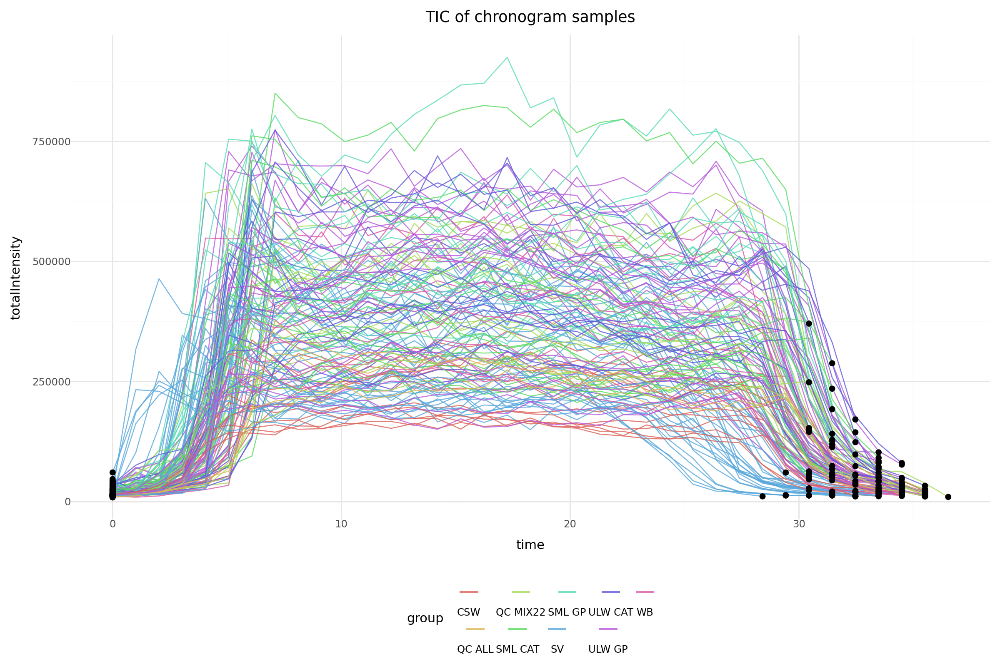

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


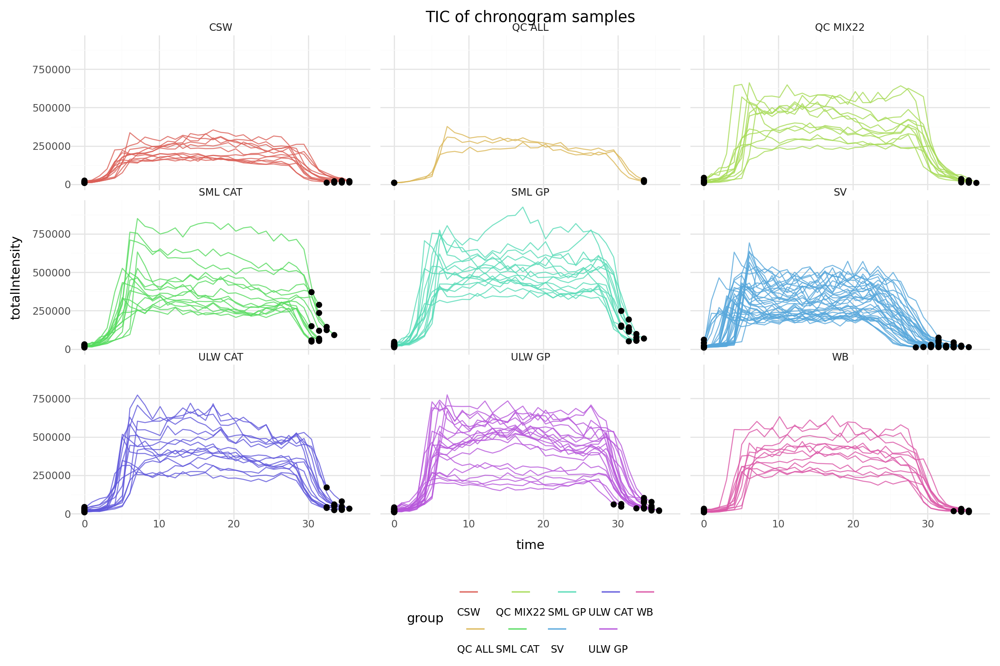

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


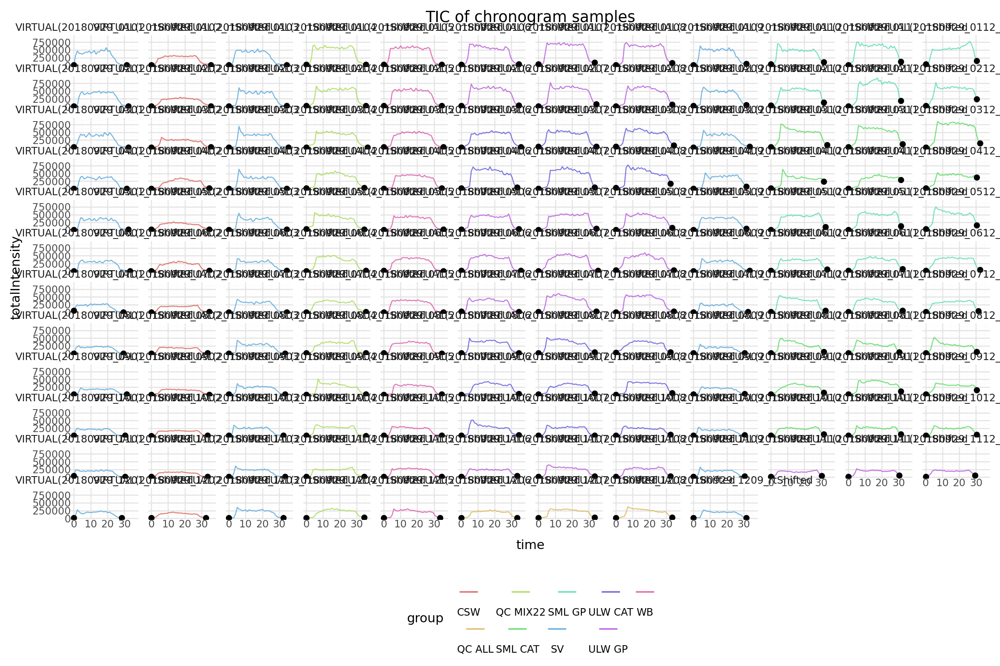

INFO:root:.. took 1.1 minutes to execute
INFO:root:Collapsing multiple spectra of samples to consensus spectra for each sample


INFO:root:    .. Sample    1 /  141 (     VIRTUAL(20180929_0101_rtShifted::Spot_0)) spectra  32, signals  35123, cluster after crude   5012, fine    289, quality control    198, final number of features    197
INFO:root:    .. Sample    2 /  141 (     VIRTUAL(20180929_0102_rtShifted::Spot_0)) spectra  36, signals  50768, cluster after crude   5408, fine    275, quality control    153, final number of features    152
INFO:root:    .. Sample    3 /  141 (     VIRTUAL(20180929_0103_rtShifted::Spot_0)) spectra  35, signals  36233, cluster after crude   5185, fine    275, quality control    183, final number of features    182
INFO:root:    .. Sample    4 /  141 (     VIRTUAL(20180929_0104_rtShifted::Spot_0)) spectra  36, signals  68875, cluster after crude   6086, fine    462, quality control    222, final number of features    221
INFO:root:    .. Sample    5 /  141 (     VIRTUAL(20180929_0105_rtShifted::Spot_0)) spectra  35, signals  74790, cluster after crude   4256, fine    786, qualit

In [6]:
## Load data

p9.options.figure_size = (12, 8)

if os.path.exists(temp_file) and os.path.isfile(temp_file):
    ## Load data from last session
    logging.info("Loading previous results from cache files")
    logging.info("")

    dartMSAssay = ms.dartms.DartMSAssay.read_from_dill_file(temp_file)

else:
    ## Process samples if the last results cannot be loaded
    ## Import chronograms and separate them into spots.
    with RecordExecutionTime():
        logging.info("Importing and separating chronograms")
        dartMSAssay = ms.dartms.DartMSAssay.create_assay_from_chronogramFiles(
            "SeaOmics_MTBL1198",
            filenames,
            ms_mode=ms_mode,
            instrument=instrument,
            spot_file=spotFile,
            centroid_profileMode=True,
            fileNameChangeFunction=lambda x: x.replace("20221230-HE-350V-400C-D25MM-POS-", "").replace("20220316-HE-350V-500C-POS-", ""),
            intensity_threshold_spot_extraction=1e1,
        )
    logging.info("")

    ### Plot an overview of the signals in the samples for semi-automated parameter optimization
    # dartMSAssay.plot_signal_neighborhood()

    ## Select only top-n spectra
    if False:
        with RecordExecutionTime():
            logging.info("Selecting only top-n abundant scans")
            dartMSAssay.select_top_n_spectra(n=10)
        logging.info("")

    ## Account for and correct mz values of individual spots by reference mz values
    with RecordExecutionTime():
        logging.info("Correcting for mz shifts between samples (not chronograms) with reference mz values")

        logging.info("First pass of mz correction")
        sampleSetA = [
            "VIRTUAL(20180929_0100_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0101_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0102_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0103_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0104_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0105_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0106_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0107_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0108_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0109_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0110_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0111_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0112_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0200::Spot_0)",
            "VIRTUAL(20180929_0201_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0202_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0203_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0204_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0205_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0206_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0207_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0208_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0209_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0210_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0211_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0212_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0300::Spot_0)",
            "VIRTUAL(20180929_0301_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0302_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0303_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0304_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0305_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0306_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0307_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0308_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0309_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0310_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0311_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0312_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0400::Spot_0)",
            "VIRTUAL(20180929_0401_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0402_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0403_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0404_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0405_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0406_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0407_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0408_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0409_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0410_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0411_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0412_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0500::Spot_0)",
            "VIRTUAL(20180929_0501_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0502_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0503_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0504_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0505_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0506_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0507_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0508_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0509_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0510_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0511_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0512_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0600::Spot_0)",
            "VIRTUAL(20180929_0601_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0602_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0603_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0604_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0605_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0606_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0607_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0608_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0609_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0610_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0611_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0612_rtShifted::Spot_0)",
        ]
        sampleSetB = [
            "VIRTUAL(20180929_0700_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0701_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0702_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0703_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0704_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0705_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0706_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0707_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0708_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0709_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0710_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0711_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0712_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0800::Spot_0)",
            "VIRTUAL(20180929_0801_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0802_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0803_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0804_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0805_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0806_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0807_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0808_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0809_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0810_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0811_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0812_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0900::Spot_0)",
            "VIRTUAL(20180929_0901_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0902_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0903_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0904_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0905_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0906_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0907_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0908_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0909_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0910_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0911_rtShifted::Spot_0)",
            "VIRTUAL(20180929_0912_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1000::Spot_0)",
            "VIRTUAL(20180929_1001_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1002_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1003_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1004_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1005_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1006_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1007_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1008_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1009_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1010_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1011_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1012_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1100::Spot_0)",
            "VIRTUAL(20180929_1101_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1102_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1103_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1104_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1105_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1106_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1107_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1108_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1109_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1110_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1111_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1112_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1200::Spot_0)",
            "VIRTUAL(20180929_1201_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1202_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1203_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1204_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1205_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1206_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1207_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1209_rtShifted::Spot_0)",
            "VIRTUAL(20180929_1208_rtShifted::Spot_0)",
        ]
        referenceMZs = [
            {
               "observedMZ": 283.34,
               "referenceMZ": 283.26401,
               "forSamples": sampleSetA,
            },
            {
               "observedMZ": 283.26401,
               "referenceMZ": 283.26401,
               "forSamples": sampleSetB,
            },
        ]
        dartMSAssay.correct_MZ_shift_across_samples(
            referenceMZs,
            max_mz_deviation_absolute=0.03,
            max_deviationPPM_to_use_for_correction=800,
            correctby="mzDeviationPPM",
            selection_criteria="mostabundant",
            correct_on_level="sample",
            plot=False,
        )

        logging.info("Second pass of mz correction")
        referenceMZs = [
            {
               "observedMZ": 283.26401,
               "referenceMZ": 283.26401,
               "forSamples": None,
            }
        ]
        dartMSAssay.correct_MZ_shift_across_samples(
            referenceMZs,
            max_mz_deviation_absolute=0.01,
            max_deviationPPM_to_use_for_correction=100,
            correctby="mzDeviationPPM",
            selection_criteria="mostabundant",
            correct_on_level="sample",
            plot=False,
        )
    logging.info("")

    ## Plot overview of chronogram samples
    with RecordExecutionTime():
        dartMSAssay.plot_sample_TICs(separate=False)
        dartMSAssay.plot_sample_TICs(separate=True)
        dartMSAssay.plot_sample_TICs(separate=True, separate_by="file")

    ## Calculate consensus spectra for each spot file to reduce following processing time
    with RecordExecutionTime():
        logging.info("Collapsing multiple spectra of samples to consensus spectra for each sample")
        dartMSAssay.calculate_consensus_spectra_for_samples(
            min_difference_ppm=100,
            closest_signal_max_deviation_ppm=20,
            max_mz_deviation_ppm=20,
            min_signals_per_cluster=5,
            minimum_intensity_for_signals=2.5e2, 
            cluster_quality_check_functions=[
                functools.partial(ms.dartms.cluster_quality_check_function__ppmDeviationCheck, max_weighted_ppm_deviation=15),
                functools.partial(ms.dartms.cluster_quality_check_function__peak_form, min_correlation_for_cutoff=0.25),
            ],
            aggregation_function="average",
            featureMLlocation="./MTBLS1198_SeaOmics_DATA/",
        )
    logging.info("")

    ## Normalize to internal standard
    if False:
        with RecordExecutionTime():
            logging.info("Normalize to internal standard")
            std = (316.29, 316.325)
            dartMSAssay.normalize_to_internal_standard(std, multiplication_factor=1e6, plot=True)
        logging.info("")

    ## Bracket/group mz features across samples of the experiment
    with RecordExecutionTime():
        logging.info("Bracketing features across samples")
        dartMSAssay.bracket_consensus_spectrum_samples(closest_signal_max_deviation_ppm=30, max_ppm_deviation=30, show_diagnostic_plots=False)
        dartMSAssay.write_bracketing_results_to_featureML(
            featureMLlocation="./MTBLS1198_SeaOmics_DATA/bracketedResults.featureML", featureMLStartRT=0, featureMLEndRT=1400
        )
        logging.info("   .. bracketed to %d features" % (len(dartMSAssay.features)))
    logging.info("")

    ## Build data matrix and annotate features
    logging.info("Generating matrix")
    dartMSAssay.build_data_matrix(on="originalData", originalData_mz_deviation_multiplier_PPM=30, aggregation_fun="average")
    annotations = dartMSAssay.annotate_features(useGroups=["CSW", "SML CAT", "SML GP", "ULW CAT", "ULW GP"], remove_other_ions=False, plot=False)

    # Save assay to file for quick prototyping
    dartMSAssay.save_self_to_dill_file(temp_file)
    logging.info("Save assay and bracketing results to file (%s)" % (temp_file))

logging.info("There are %d features and %d samples in the data matrix" % (dartMSAssay.dat.shape[1], dartMSAssay.dat.shape[0]))
logging.info("The groups are %s" % (", ".join(natsort.natsorted(list(set(dartMSAssay.groups))))))


In [7]:
refFeatures = [
    (283.2640, "recalibration value"), ## value used for recalibration
    ( 83.0363, "Table S3. Calibration mz values"),  ## Table S3 of seaomics publication: Calibration values of DARTMS
    (115.0037, "Table S3. Calibration mz values"),
    (148.9914, "Table S3. Calibration mz values"),
    (196.0615, "Table S3. Calibration mz values"),
    (249.1245, "Table S3. Calibration mz values"),
    (280.1051, "Table S3. Calibration mz values"),
    (375.1925, "Table S3. Calibration mz values"),
    (413.1305, "Table S3. Calibration mz values"),
    (449.1072, "Table S3. Calibration mz values"),
    (529.1415, "Table S3. Calibration mz values"),
    (610.1993, "Table S3. Calibration mz values"),
    (625.3242, "Table S3. Calibration mz values"),
    (751.3923, "Table S3. Calibration mz values"),
    (789.3303, "Table S3. Calibration mz values"),
]

print("There are %d reference features to be tested" % (len(refFeatures)))
print(dartMSAssay.get_summary_of_results(reference_features=[f[0] for f in refFeatures], reference_features_allowed_deviationPPM=150))
print("")
print("There are %d discriminant features from Table 1 to be tested" % (len(discriminantFeaturesTable1)))
print(dartMSAssay.get_summary_of_results(discriminantFeaturesTable1, reference_features_allowed_deviationPPM=150))

There are 15 reference features to be tested
{'n(feats)': 725, 'avg(feats.MZDevPPM)': 7.700151564321003, 'std(feats.MZDevPPM)': 6.4690857040687435, 'n(nan)': 4004, 'r(nan)': 0.039168500855954996, 'n(ref)': 4, 'avg(ref.MZDevPPM)': 42.627846706855436, 'std(ref.mzDevPPM)': 52.92699742443262}

There are 11 discriminant features from Table 1 to be tested
{'n(feats)': 725, 'avg(feats.MZDevPPM)': 7.700151564321003, 'std(feats.MZDevPPM)': 6.4690857040687435, 'n(nan)': 4004, 'r(nan)': 0.039168500855954996, 'n(ref)': 8, 'avg(ref.MZDevPPM)': -0.8590572183314793, 'std(ref.mzDevPPM)': 2.213910247790157}


## Mass deviations

There is a considerable mass shit that seems to be constant accros each sample. It definetly has a time-trend that somewhat constantly increases over time. 

Note: no correction to a predefined mz value of a particual known ion has been carried out, but rather an average mz correction using averaged mz values from a couple of compounds (or contaminants) found throughout all measurements

|    |   reference |   observed |     deviation | referenceType                   |
|---:|------------:|-----------:|--------------:|:--------------------------------|
|  0 |    283.264  |   283.264  |    0.00642041 | recalibration value             |
|  1 |     83.0363 |    80.9167 | -250          | Table S3. Calibration mz values |
|  2 |    115.004  |   115.04   |  250          | Table S3. Calibration mz values |
|  3 |    148.991  |   149.061  |  250          | Table S3. Calibration mz values |
|  4 |    196.061  |   196.843  |  250          | Table S3. Calibration mz values |
|  5 |    249.125  |   249.149  |   99.2136     | Table S3. Calibration mz values |
|  6 |    280.105  |   279.233  | -250          | Table S3. Calibration mz values |
|  7 |    375.192  |   375.185  |  -19.5315     | Table S3. Calibration mz values |
|  8 |    413.13   |   413.218  |  211.397      | Table S3. Calibration mz values |
|  9 |    449.107  |   449.175  |  152.042      | Table S3. Calibration mz v

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


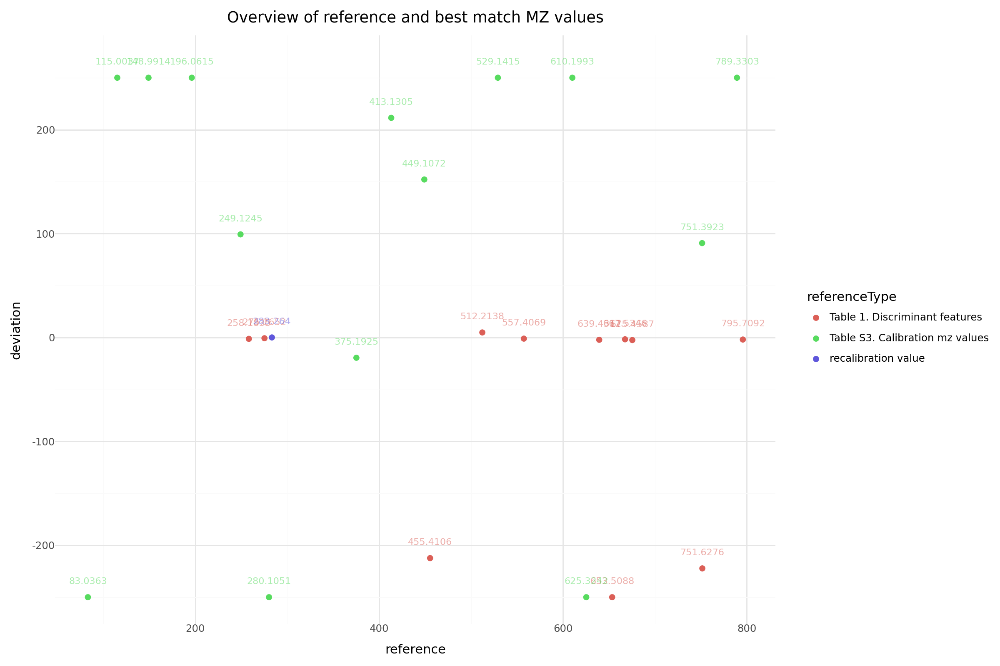

In [9]:
## Plot example features

## generate summary overview
temp = {"reference": [], "observed": [], "deviation": [], "referenceType": []}

for featureMZ, type in refFeatures + [(i, "Table 1. Discriminant features") for i in discriminantFeaturesTable1]:
    refFeatureInd = np.argmin(np.abs(np.array([avmz for _, avmz, _, _ in dartMSAssay.features]) - featureMZ))
    observedMZ = dartMSAssay.features[refFeatureInd][1]
    diffPPM = (observedMZ - featureMZ) / featureMZ * 1e6
    diffPPM = 250 if diffPPM > 250 else -250 if diffPPM < -250 else diffPPM

    temp["reference"].append(featureMZ)
    temp["observed"].append(observedMZ)
    temp["deviation"].append(diffPPM)
    temp["referenceType"].append(type)

temp = pd.DataFrame(temp)
print(temp.to_markdown())
p = p9.ggplot(data=temp, mapping=p9.aes(x="reference", y="deviation", colour="referenceType", label = "reference")) + p9.theme_minimal() + p9.geom_text(mapping=p9.aes(y="deviation+15"), size = 8, alpha = 0.5) + p9.geom_point(size = 2) + p9.ggtitle("Overview of reference and best match MZ values")
print(p)

## show individual results of found features
if False:
    maxOffset = 250
    for featureMZ, type in refFeatures:
        refFeatureInd = np.argmin(np.abs(np.array([avmz for _, avmz, _, _ in dartMSAssay.features]) - featureMZ))
        if abs(featureMZ - dartMSAssay.features[refFeatureInd][1]) / featureMZ * 1E6 <= maxOffset:
            dartMSAssay.plot_feature_mz_deviations(refFeatureInd, refMZ=featureMZ)
        else:
            logging.error("MZ %.4f not found (within a window of %f ppm)"%(featureMZ, maxOffset))


The above plots show the raw and consensus, corrected mz values found for signals and features in the samples. Generally, there is a continuously growing deviation present in the dataset that is stronger in the starting airblank samples at the beginning of the measurement sequence and then flattens out when the actual samples are being measured. 

All above depictions show that the shift could be corrected quite well using a simple ppm mz correction calculated from several pre-specified mz values. In the majority of the instances the mz ppm deviation after mz correction and consensus feature calculation was below 20 ppm. 

Two instances showed increased deviation in the airblank samples after the correction has been carried out. 

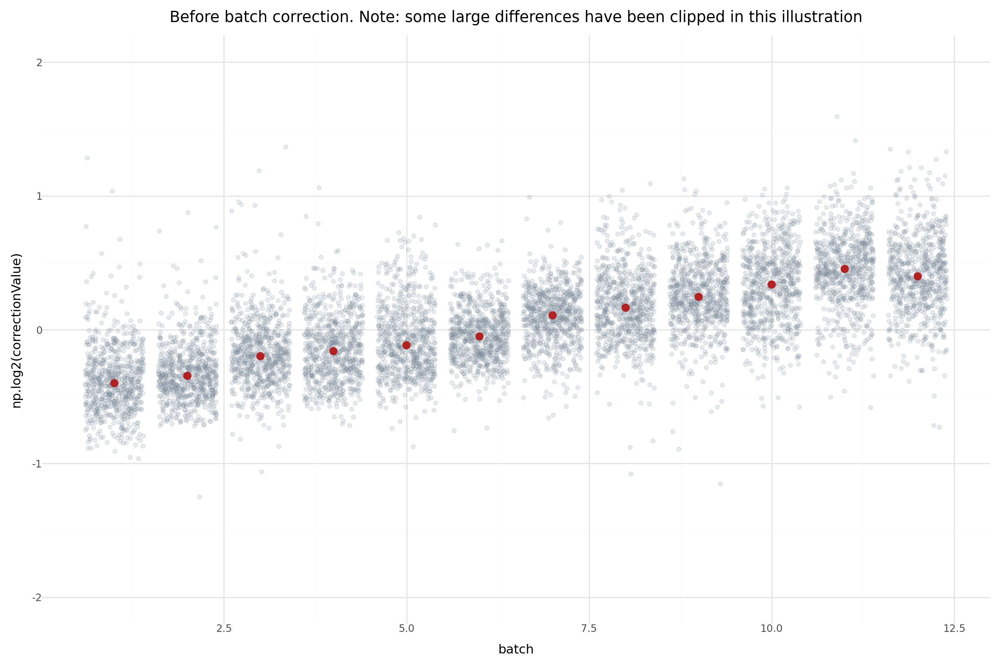

INFO:root: Batch effect correction carried out. 722 / 725 features were eligible for correction and 8551 / 8700 batches have been corrected. 
INFO:root: Batch correction values are
INFO:root:|    |   batch |   featurei |   correctionValue |   meanValue |
|---:|--------:|-----------:|------------------:|------------:|
|  0 |       1 |      366   |          0.757951 |     165.154 |
|  1 |       2 |      366.5 |          0.787046 |     154.561 |
|  2 |       3 |      367   |          0.871667 |     149.92  |
|  3 |       4 |      369   |          0.894655 |     142.2   |
|  4 |       5 |      366   |          0.922238 |     140.16  |
|  5 |       6 |      368   |          0.965548 |     136.087 |
|  6 |       7 |      367.5 |          1.07719  |     120.032 |
|  7 |       8 |      366   |          1.12039  |     112.44  |
|  8 |       9 |      369.5 |          1.18526  |     107.038 |
|  9 |      10 |      369.5 |          1.26353  |     100.044 |
| 10 |      11 |      371.5 |          1.

In [11]:
## Batch correction

if True:
    dartMSAssay.batch_correction(by_group="QC MIX22", plot=True)

## Blank subtraction

In [12]:
## Blank subtraction with QC sample

if False:
    logging.info("Remove features that are likely only the background")
    oFeatures = dartMSAssay.dat.shape[1]
    dartMSAssay.blank_subtraction("airblank", ["QC", "Cntrl", "ccRCC"], foldCutoff=2, plot=True)
    dartMSAssay.blank_subtraction("blank", ["QC", "Cntrl", "ccRCC"], foldCutoff=2, plot=True)
    dartMSAssay.write_bracketing_results_to_featureML(
        featureMLlocation="./mzML/bracketedResults_afterBlankSubtraction.featureML", featureMLStartRT=0, featureMLEndRT=1400
    )

The blank subtraction removed many feature that are likely contaminants or other unspecific signals. The remaining features should represent true compounds found in the pre, post and QC samples. Thus, not every feature must be a true serum metabolite but could also be a standard or a contaminant from the QC samples. 

## Statistics

In [13]:
## Restrict features to high-quality ones

if False:

    logging.info("There are %d features present in the dataset before selecting only highly quality ones" % (dartMSAssay.dat.shape[1]))
    rec = dartMSAssay.clone_DartMSAssay()
    print(sorted(set(rec.groups)))

    ## Restrict to n most abundant features
    # dartMSAssay.restrict_to_high_quality_features__most_n_abundant(
    #    n_features = 500
    # )

    ## Restrict to feautres found in at least x% of the replicates
    dartMSAssay.restrict_to_high_quality_features__found_in_replicates(
        test_groups=dartMSAssay.get_groups(), minimum_ratio_found=0.75, found_in_type="anyGroup"
    )

    ## Minimum intensity filter
    dartMSAssay.restrict_to_high_quality_features__minimum_intensity_filter(test_groups=dartMSAssay.get_groups(), minimum_intensity=5e2)

    ## Write used features to a new featureML file
    dartMSAssay.write_bracketing_results_to_featureML(
        featureMLlocation="./mzML/bracketedResults_selectionHighQualityFeatures.featureML", featureMLStartRT=0, featureMLEndRT=1400
    )


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


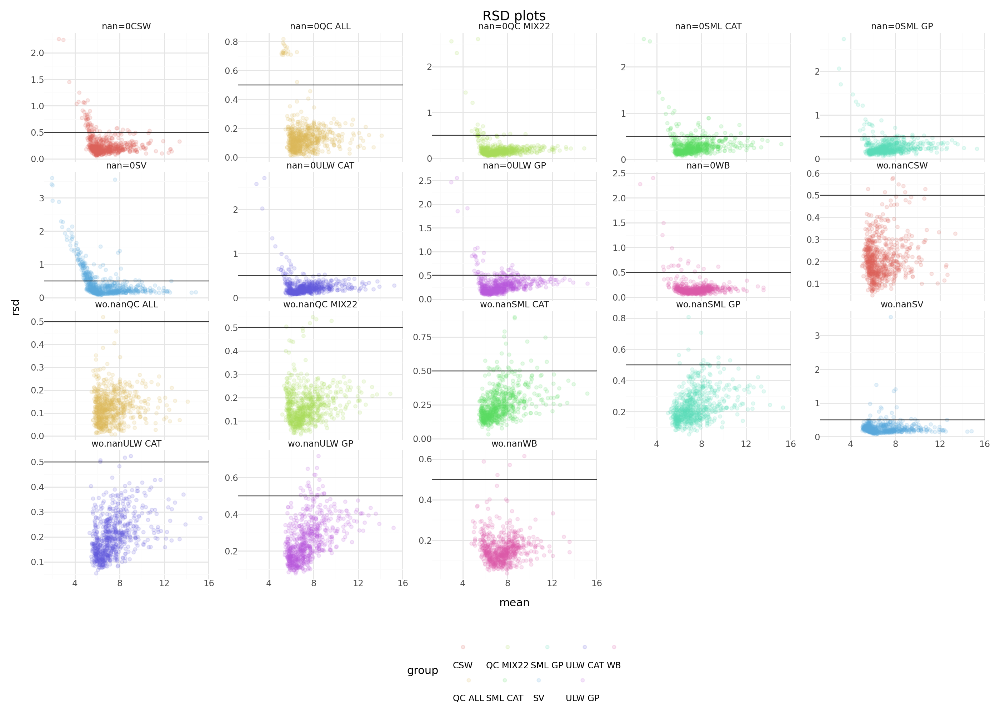


|                        |   count |     mean |       std |        min |        5% |       10% |       25% |      50% |      75% |      90% |      95% |      max |
|:-----------------------|--------:|---------:|----------:|-----------:|----------:|----------:|----------:|---------:|---------:|---------:|---------:|---------:|
| ('CSW', 'nan=0')       |     722 | 0.25421  | 0.201315  | 0.0463066  | 0.0976102 | 0.116811  | 0.150151  | 0.198798 | 0.278825 | 0.445679 | 0.602984 | 2.25961  |
| ('CSW', 'wo.nan')      |     722 | 0.208042 | 0.085864  | 0.0463066  | 0.0975877 | 0.116468  | 0.1487    | 0.194718 | 0.250101 | 0.315056 | 0.366186 | 0.577733 |
| ('QC ALL', 'nan=0')    |     711 | 0.140225 | 0.119905  | 0.00627479 | 0.0346911 | 0.0447799 | 0.0782475 | 0.119909 | 0.163581 | 0.216317 | 0.260647 | 0.816497 |
| ('QC ALL', 'wo.nan')   |     711 | 0.123706 | 0.0651095 | 0.00627479 | 0.0341647 | 0.044481  | 0.0767413 | 0.118027 | 0.158983 | 0.204937 | 0.23192  | 0.519357 |
| ('QC MIX22', 

In [14]:
## RSD plots

p9.options.figure_size = (14, 10)  ## (20,12)
p, temp = dartMSAssay.plot_RSDs_per_group(plotType="points")
print(p + p9.geom_hline(yintercept = 0.5, alpha = 0.75))
print(temp.groupby(["group", "type"])["rsd"].describe(percentiles = [0.05, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95]).to_markdown())

The repeatability of the sample groups shows a low deviation of replicates in the post and pre samples using the extracted and cleaned set of features that are likely metabolites of serum and that have a high quality in the serum samples. Furthermore, also the airblank samples and the quality control samples have high reproducibility. The RSDs of 75% of the metabolites found in the pre and post samples is less than 40%. 

The above plot shows the used metabolites' abundances in the QC samples (i.e., the sample measured between the pre and post serum samples) during the measurement sequence. The different metabolites were sorted into clusters according to a hierarchical clustering strategy with manually defined subclusters.
Moreover, the results are shown 

As can be seen, several metabolites show similar patterns, and many of the pattern clusters shows a slight increase in abundance towards later batch numbers. The difference to the mean value of the QC samples is mostly (90-percentile) between -0.55 and 0.42, i.e., factors ~0.7 and ~1.41 (1/1.41 and 1.41). Thus, for 90% or the data observed, the differences are +/- 40%. 

As a result, there is not really a need to account for batch-effects as this additional variation can be neglected and accounting for a batch effect can be neglected for now. 

### Univariate statistical analysis

100%|██████████| 725/725 [00:02<00:00, 305.29it/s]
INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


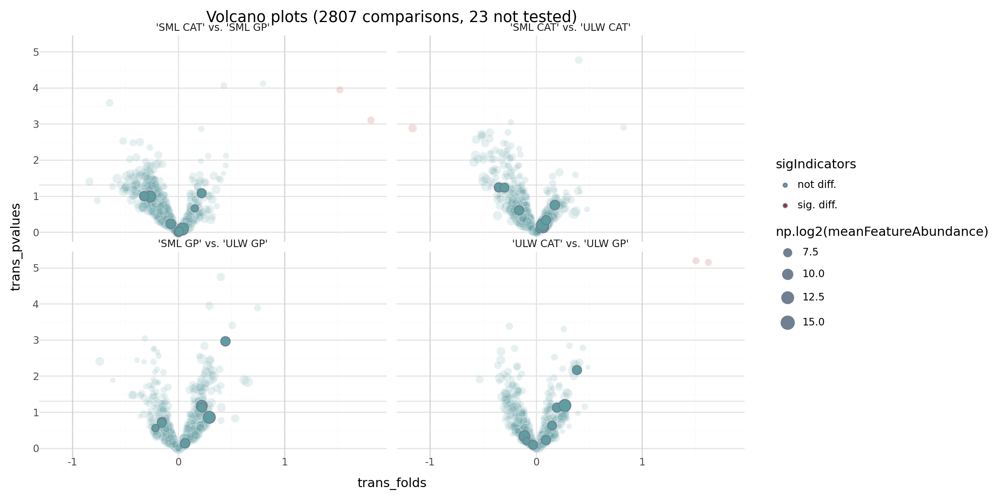


|      |    pvalues |   pvalues_WilcoxonRankTest |    folds |   trans_pvalues |   trans_folds |   effectSizes |   detectionsGrp1 |   detectionsGrp2 |   zerosGrp1 |   zerosGrp2 |   meanAbundanceGrp1 |   meanAbundanceGrp2 |   stdAbundanceGrp1 |   stdAbundanceGrp2 | sigIndicators   | tests                   | feature         |   featuremz |   featurei | highlightFeature   |   meanFeatureAbundance |
|-----:|-----------:|---------------------------:|---------:|----------------:|--------------:|--------------:|-----------------:|-----------------:|------------:|------------:|--------------------:|--------------------:|-------------------:|-------------------:|:----------------|:------------------------|:----------------|------------:|-----------:|:-------------------|-----------------------:|
|  154 | 0.733556   |                 0.724416   | 1.04672  |      0.134567   |    0.0658792  |    0.125631   |               15 |               15 |           0 |           0 |            1997.88  |  

exporting featureML: 100%|██████████| 3/3 [00:00<00:00, 1501.72it/s]


In [16]:
## Volcano plot

p9.options.figure_size = (12, 6)  ## (20,12)
import statsmodels.api as sm
from statsmodels.formula.api import ols

# grps = CSW, QC ALL, QC MIX22, SV, WB,      SML CAT, SML GP, ULW CAT, ULW GP
volcanoPlots = [
    ["SML CAT", "ULW CAT"],
    ["SML GP", "ULW GP"],
    ["SML CAT", "SML GP"],
    ["ULW CAT", "ULW GP"],
] 

p, temp = dartMSAssay.calc_volcano_plots(volcanoPlots, highlight_features = [i for i, feature in enumerate(dartMSAssay.features) if any([abs(feature[1] - refmz) / refmz * 1e6 <= 10 for refmz in discriminantFeaturesTable1])])
print(p + p9.theme_minimal())
print(temp[temp["highlightFeature"]].sort_values(by="featuremz").to_markdown())


## Write used features to a new featureML file
h = dartMSAssay.clone_DartMSAssay()
h.subset_features(keep_features_with_indices=list(set([int(i) for i in temp[temp["sigIndicators"] != "not diff."]["featurei"]])))
h.write_bracketing_results_to_featureML(
    featureMLlocation="./MTBLS1198_SeaOmics_DATA/bracketedResults_sigDifferentFeatures.featureML", featureMLStartRT=0, featureMLEndRT=1400
)


Processing feature with mz 545.4049


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


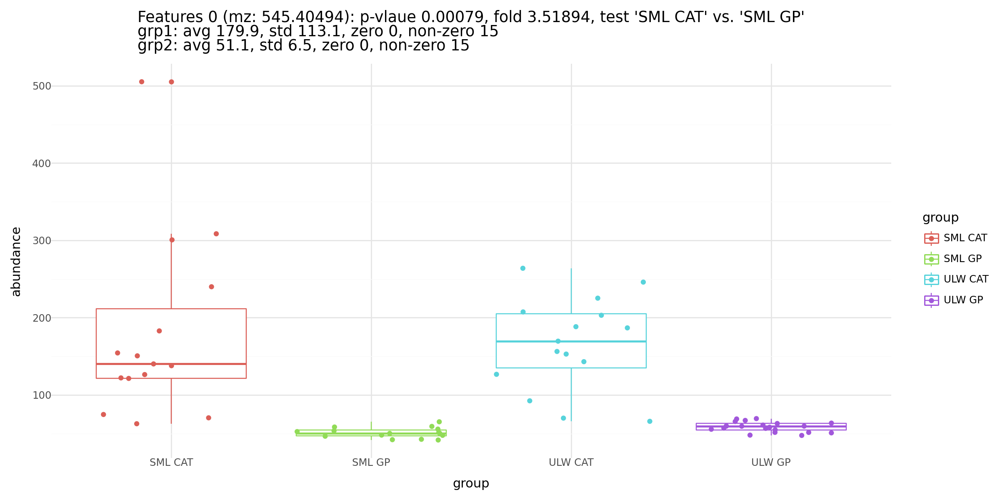

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


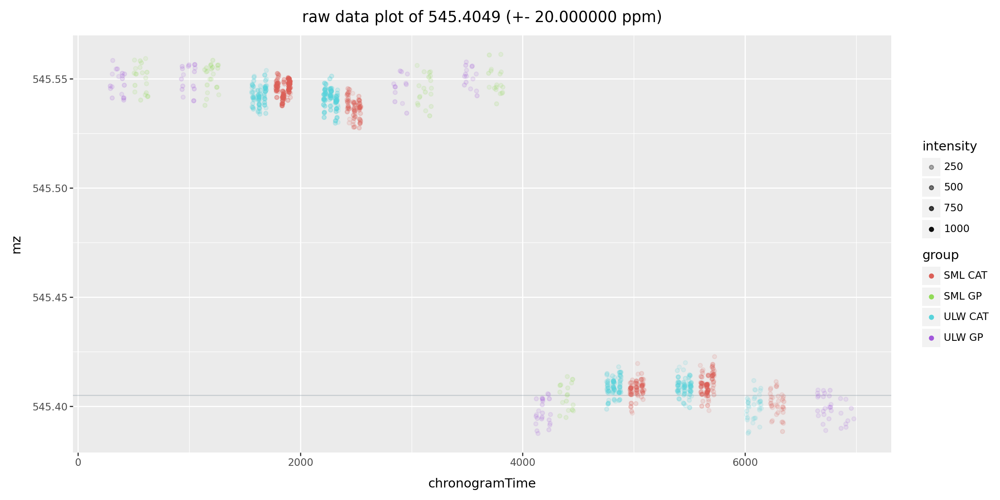

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


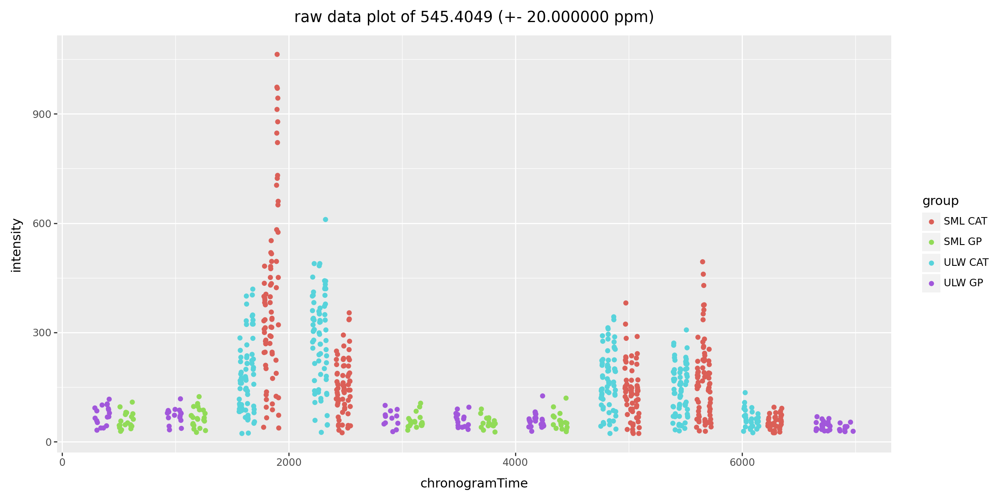

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


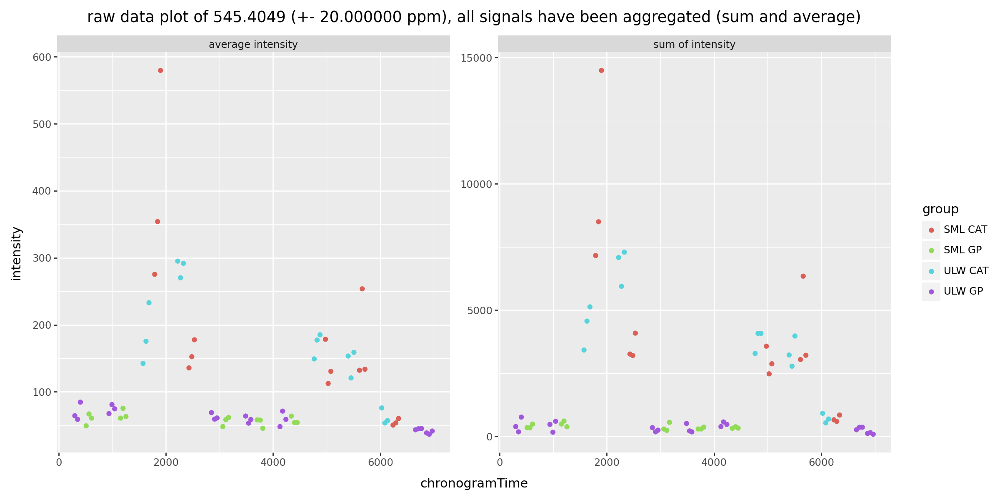


Processing feature with mz 517.3745


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


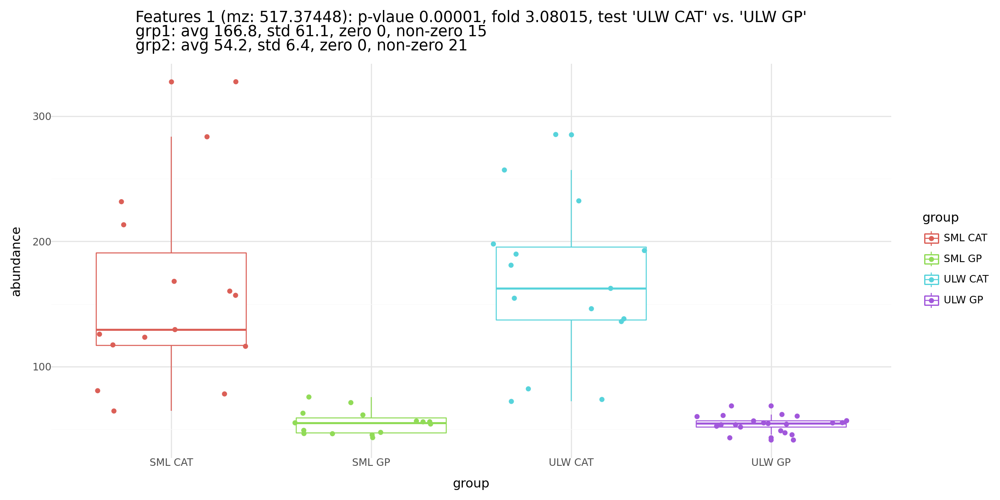

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


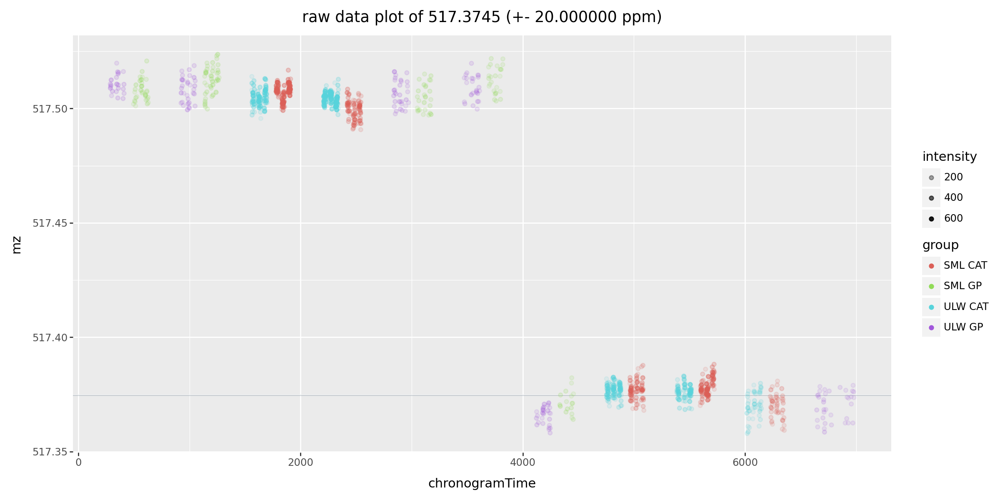

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


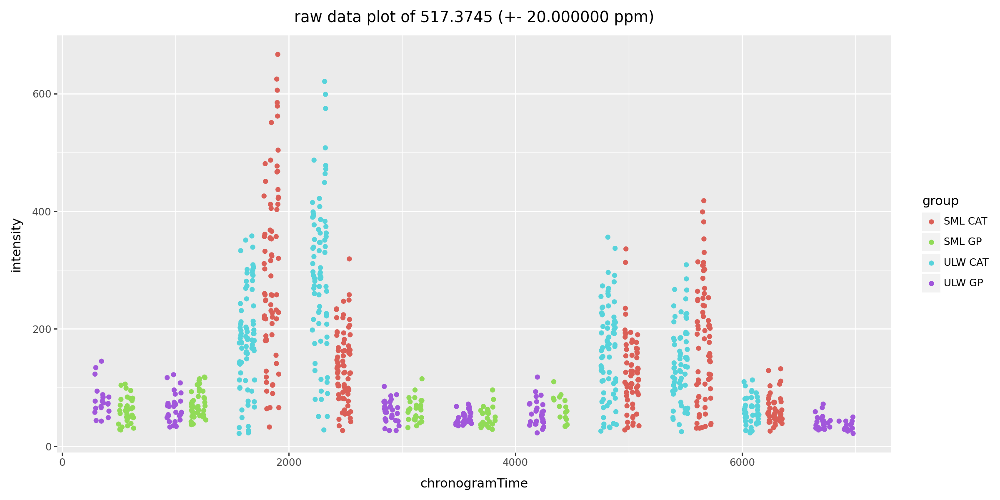

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


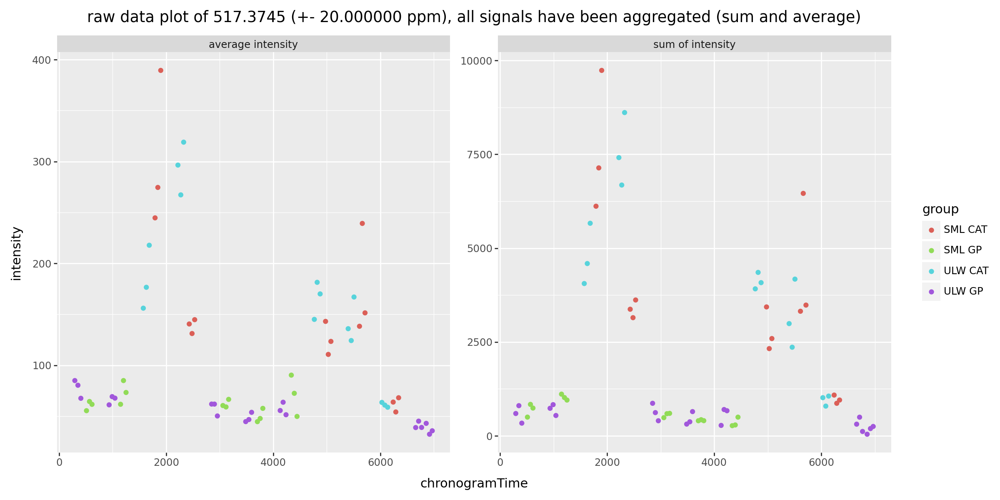


Processing feature with mz 517.3745


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


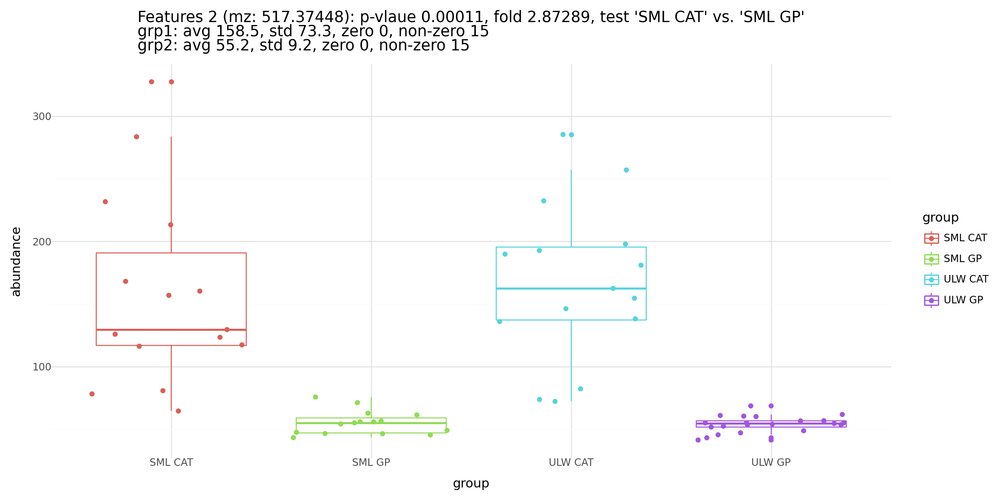

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


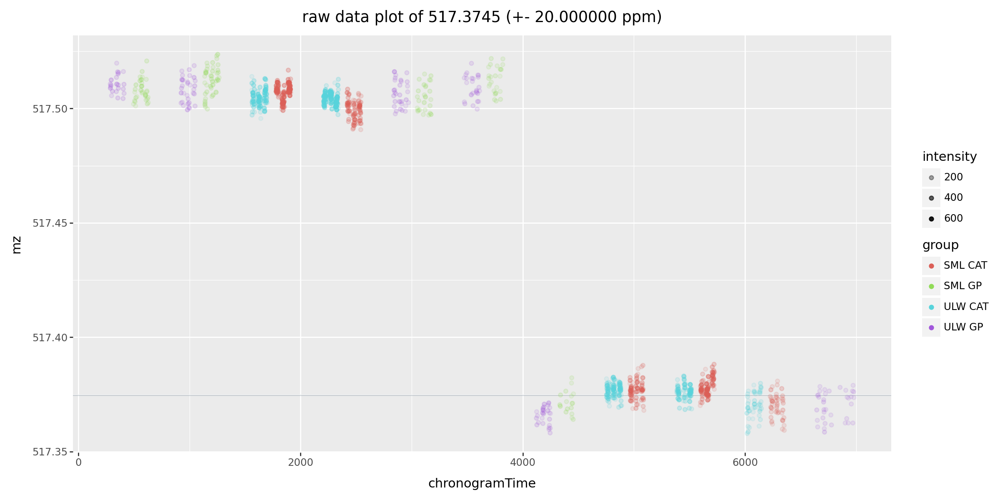

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


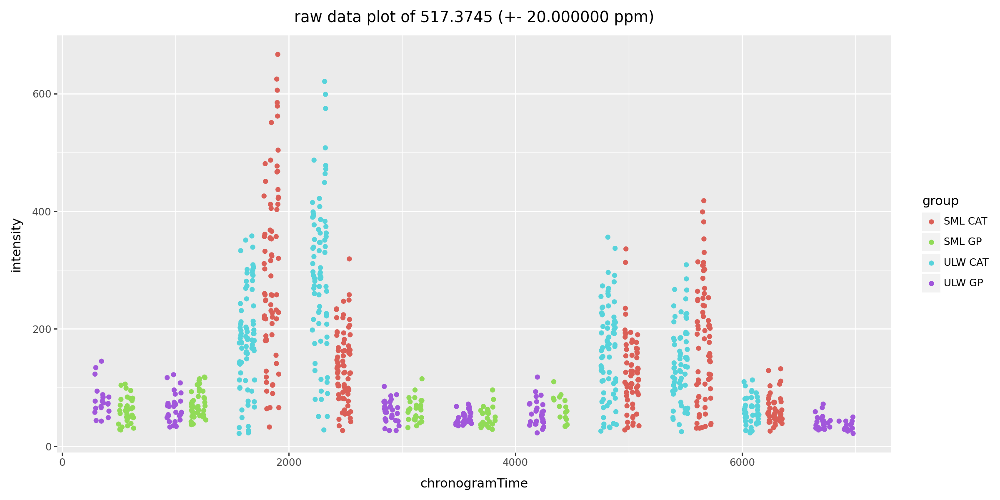

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


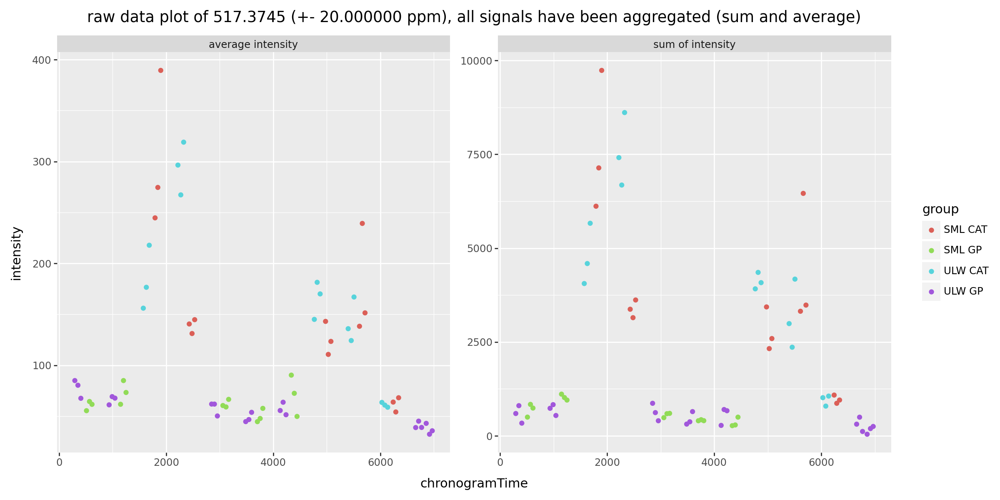


Processing feature with mz 545.4049


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


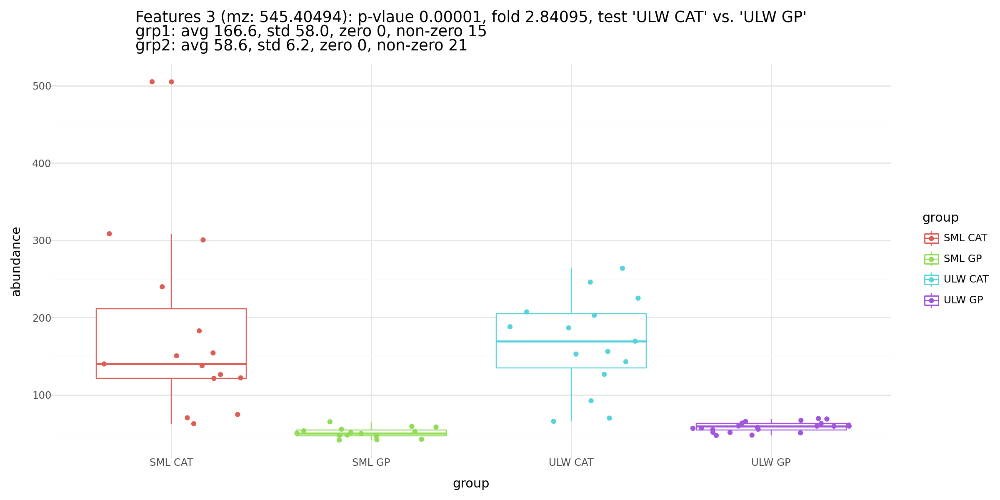

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


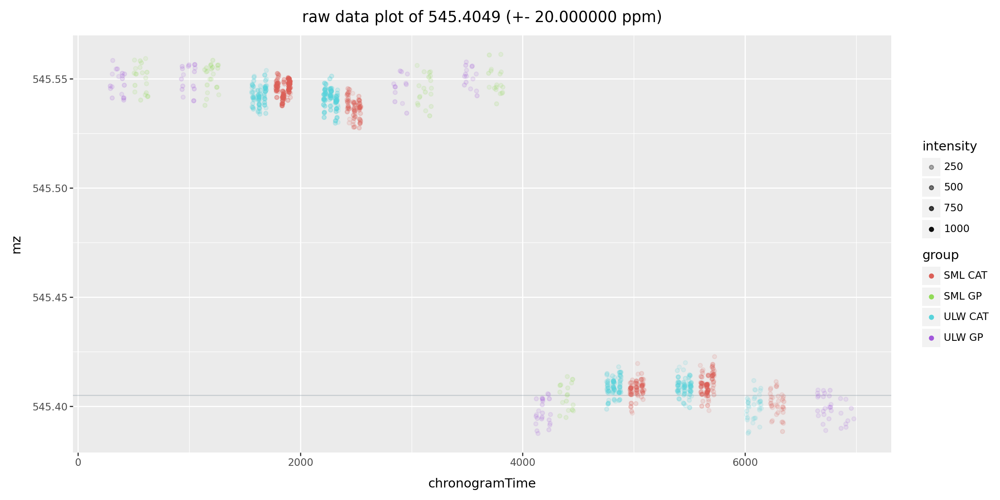

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


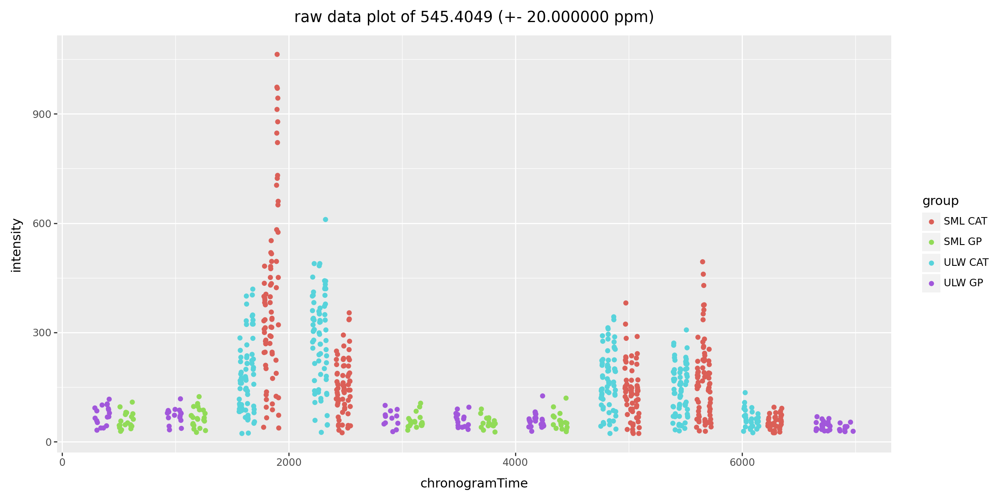

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


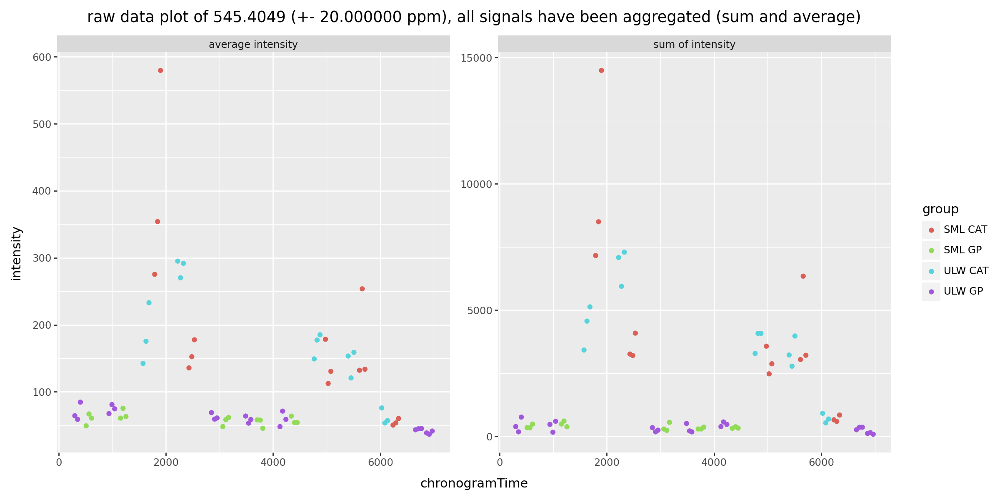

In [17]:
a = temp[temp["folds"] > 2]
a = a.sort_values(by="folds", axis=0, ascending=False)
a["featurei"]
keep_groups = ["SML CAT", "SML GP", "ULW CAT", "ULW GP"]

for i in range(min(10, len(a.index))):
    print("Processing feature with mz %.4f"%(dartMSAssay.features[a["featurei"].iloc[i]][1]))

    p, temph = dartMSAssay.generate_feature_abundance_plot(a["featurei"].iloc[i], keep_groups = keep_groups)
    fi = a["featurei"].iloc[i]
    print(
        p
        + p9.theme_minimal()
        + p9.ggtitle(
            "Features %s (mz: %.5f): p-vlaue %.5f, fold %.5f, test %s\ngrp1: avg %.1f, std %.1f, zero %d, non-zero %d\ngrp2: avg %.1f, std %.1f, zero %d, non-zero %d"
            % (
                i,
                dartMSAssay.features[fi][1],
                a["pvalues"].iloc[i],
                a["folds"].iloc[i],
                a["tests"].iloc[i],
                a["meanAbundanceGrp1"].iloc[i],
                a["stdAbundanceGrp1"].iloc[i],
                a["zerosGrp1"].iloc[i],
                a["detectionsGrp1"].iloc[i],
                a["meanAbundanceGrp2"].iloc[i],
                a["stdAbundanceGrp2"].iloc[i],
                a["zerosGrp2"].iloc[i],
                a["detectionsGrp2"].iloc[i],
            )
        )
    )
    
    pr1, pr2, pr3, pra, tempr = dartMSAssay.generate_feature_raw_plot(dartMSAssay.features[a["featurei"].iloc[i]][1], keep_groups = keep_groups)
    if tempr is not None:
        print(pr1)
        print(pr2)
        print(pr3)
    else:
        print("No raw signals found")


The volcano plot shows the comparison of the pre and post groups as well as with the QC samples.

Only few metabolites seem to be significantly different between the pre and post samples. However, a closer inspection of these using the boxplots shows, that in most cases the differences are not as large and consistend accross the samples as the volcano plot would suggest. Thus, it can be concluded, that there is no constituent difference between the pre and post samples. 



Showing raw data for feature 258.1835


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


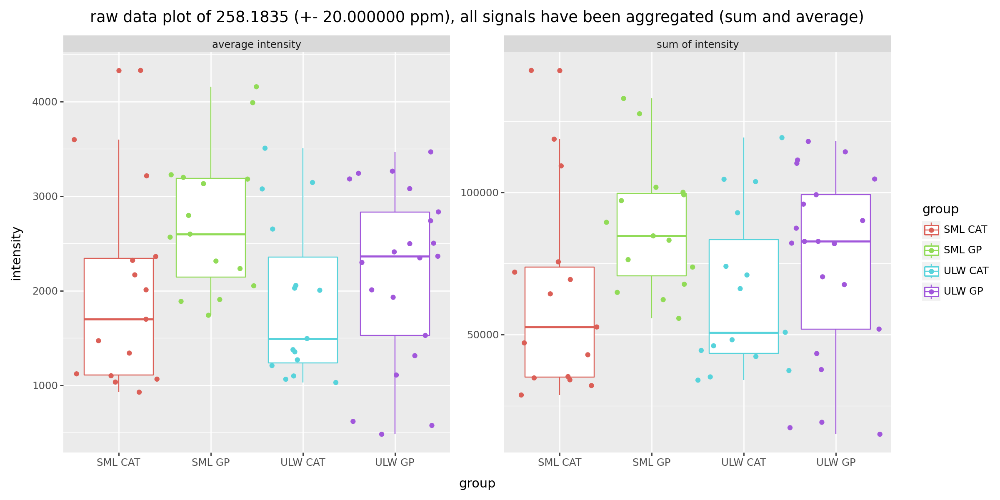




Showing raw data for feature 275.1652


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


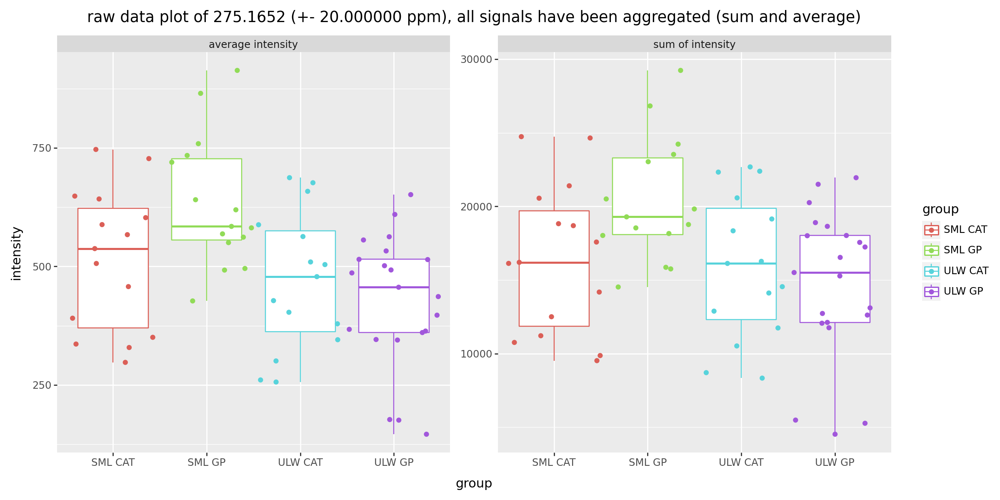




Showing raw data for feature 455.4106


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


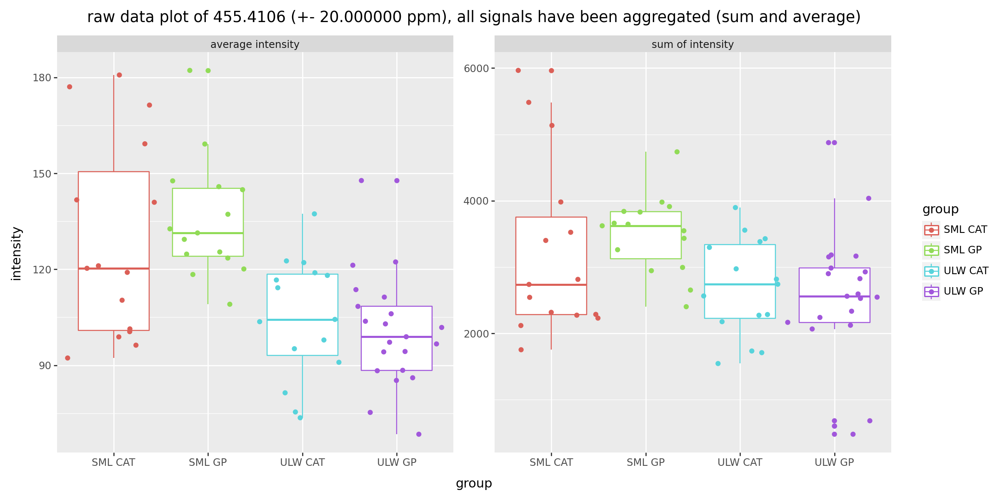




Showing raw data for feature 512.2138


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


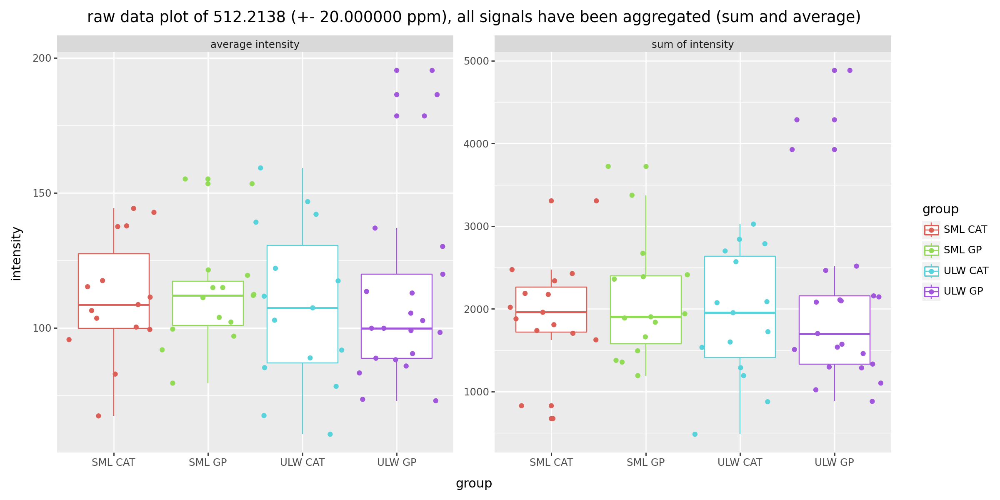




Showing raw data for feature 557.4069


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


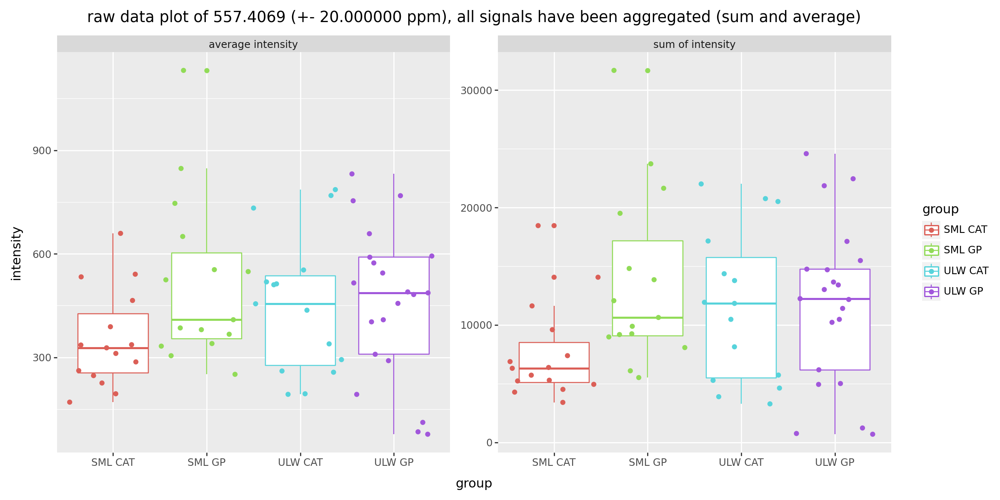




Showing raw data for feature 639.4312


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


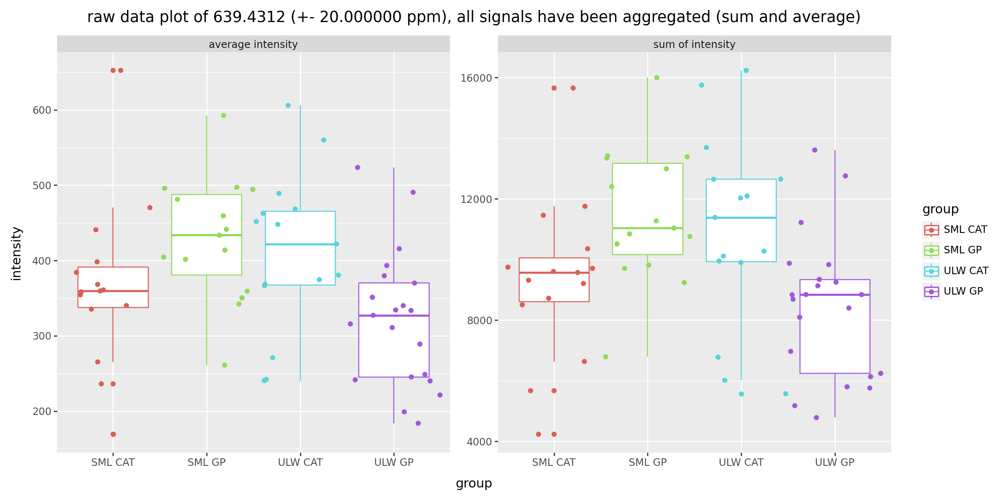




Showing raw data for feature 653.5088


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


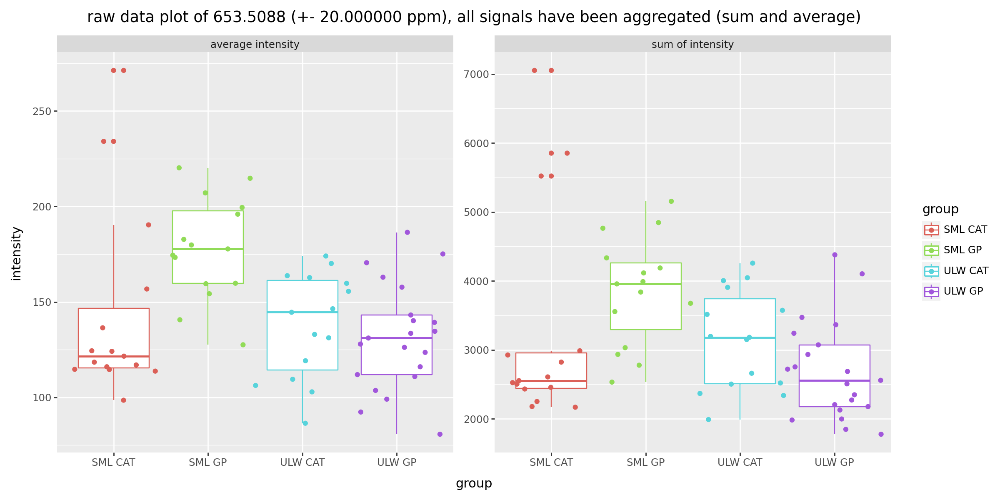




Showing raw data for feature 667.5346


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


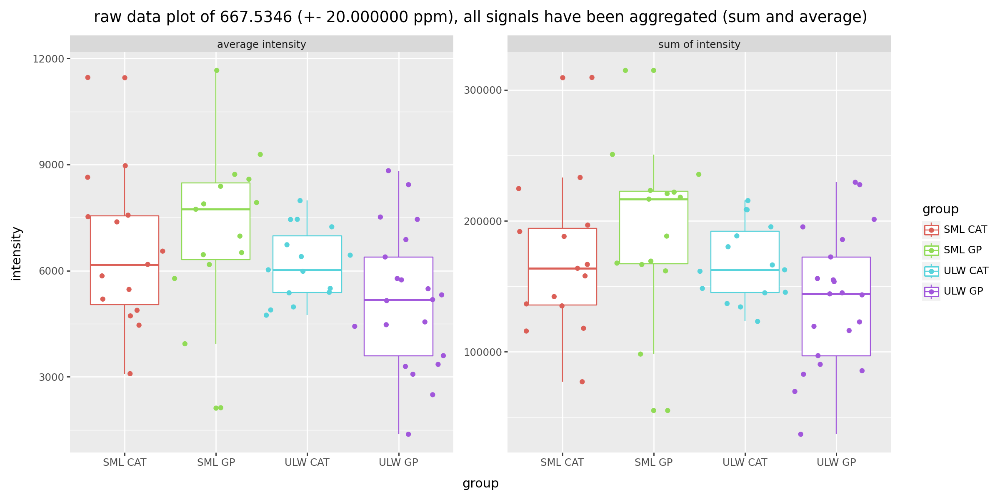




Showing raw data for feature 675.4587


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


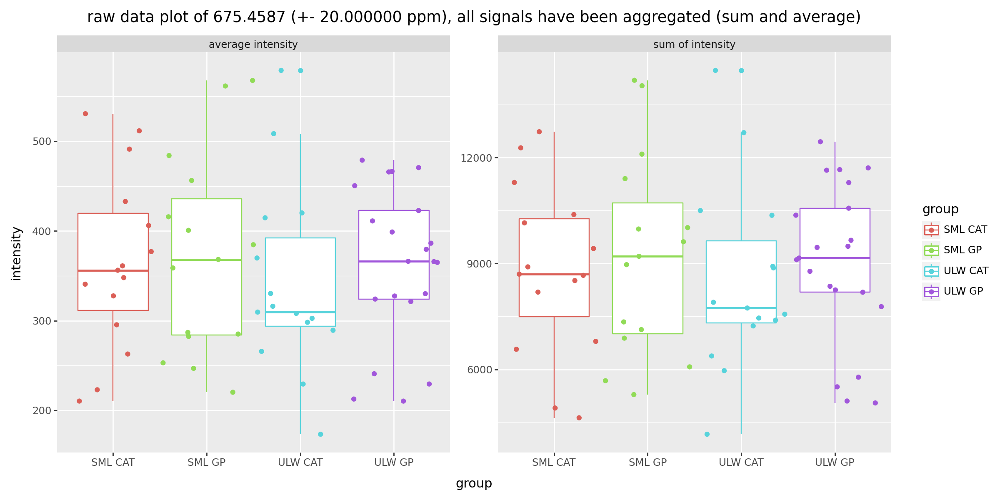




Showing raw data for feature 751.6276


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


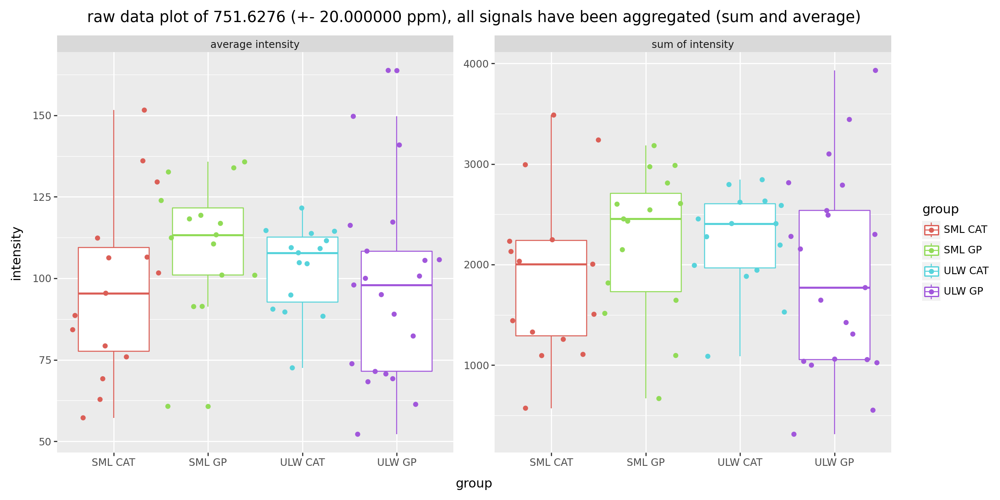




Showing raw data for feature 795.7092


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


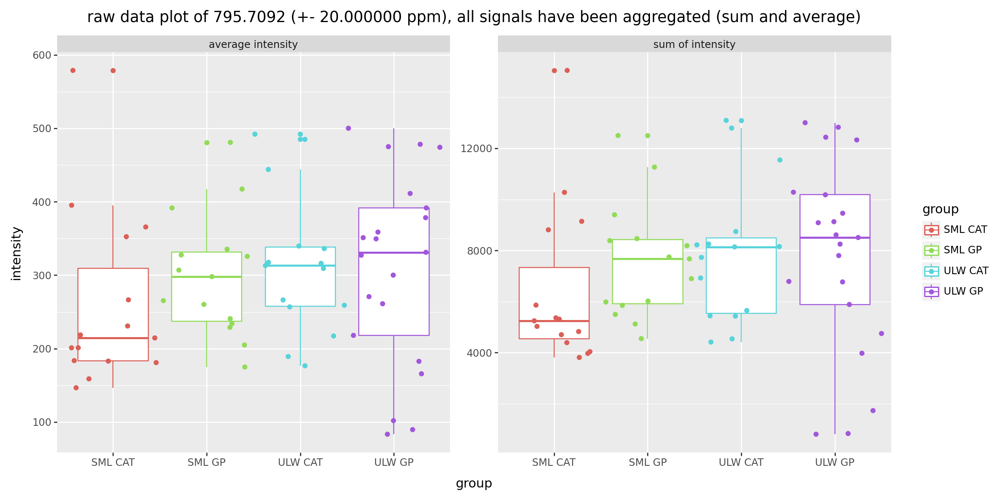

In [18]:
## Show discriminant features of Table 1 of the seaomics publicatoin

for mz in discriminantFeaturesTable1:
    print("\n\nShowing raw data for feature %.4f"%(mz))
    pr1, pr2, pr3, pra, tempr = dartMSAssay.generate_feature_raw_plot(mz, keep_groups = keep_groups)

    if tempr is not None:
        #print(pr1)
        #print(pr2)
        #print(pr3)
        print(pra)
    else:
        print("No raw signals found")

### Multivariate statistical analysis

#### PCA

c:\Users\christoph\miniconda3\envs\test123\lib\site-packages\plotnine\stats\stat_ellipse.py:65: PlotnineWarning: Too few points to calculate an ellipse
INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


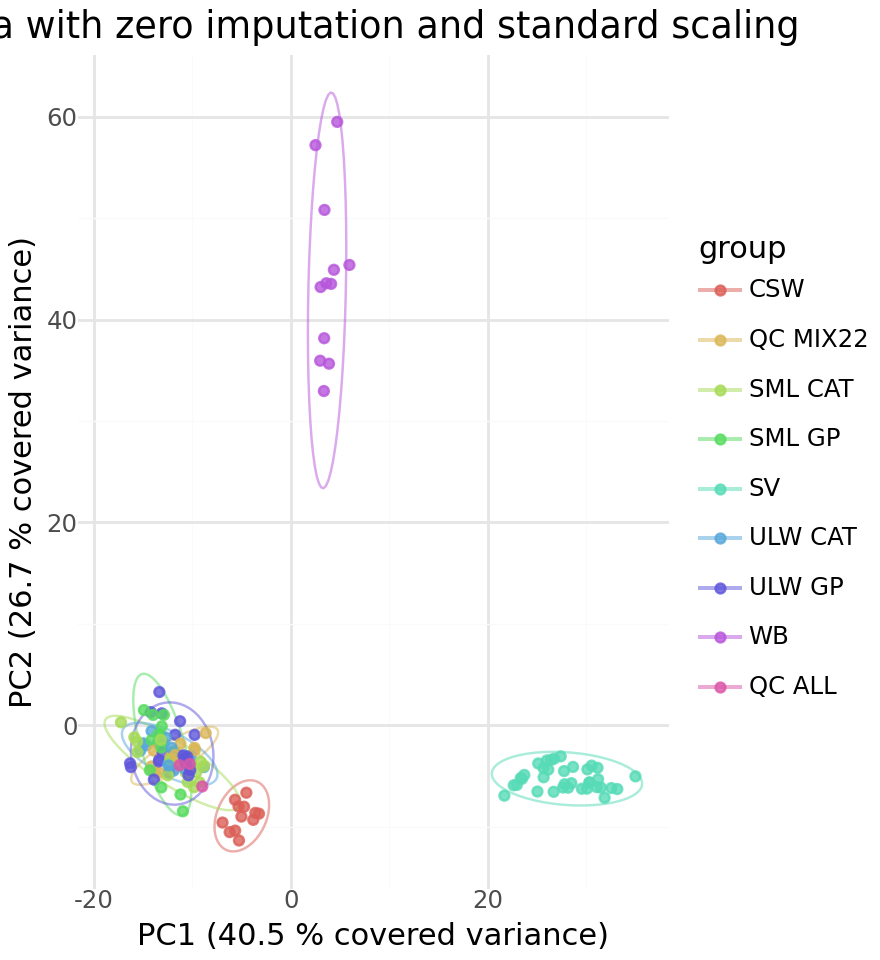

c:\Users\christoph\miniconda3\envs\test123\lib\site-packages\plotnine\ggplot.py:604: PlotnineWarning: Saving 4.4 x 4.8 in image.
c:\Users\christoph\miniconda3\envs\test123\lib\site-packages\plotnine\ggplot.py:605: PlotnineWarning: Filename: ./PCA_all.png
c:\Users\christoph\miniconda3\envs\test123\lib\site-packages\plotnine\stats\stat_ellipse.py:65: PlotnineWarning: Too few points to calculate an ellipse
INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt
INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


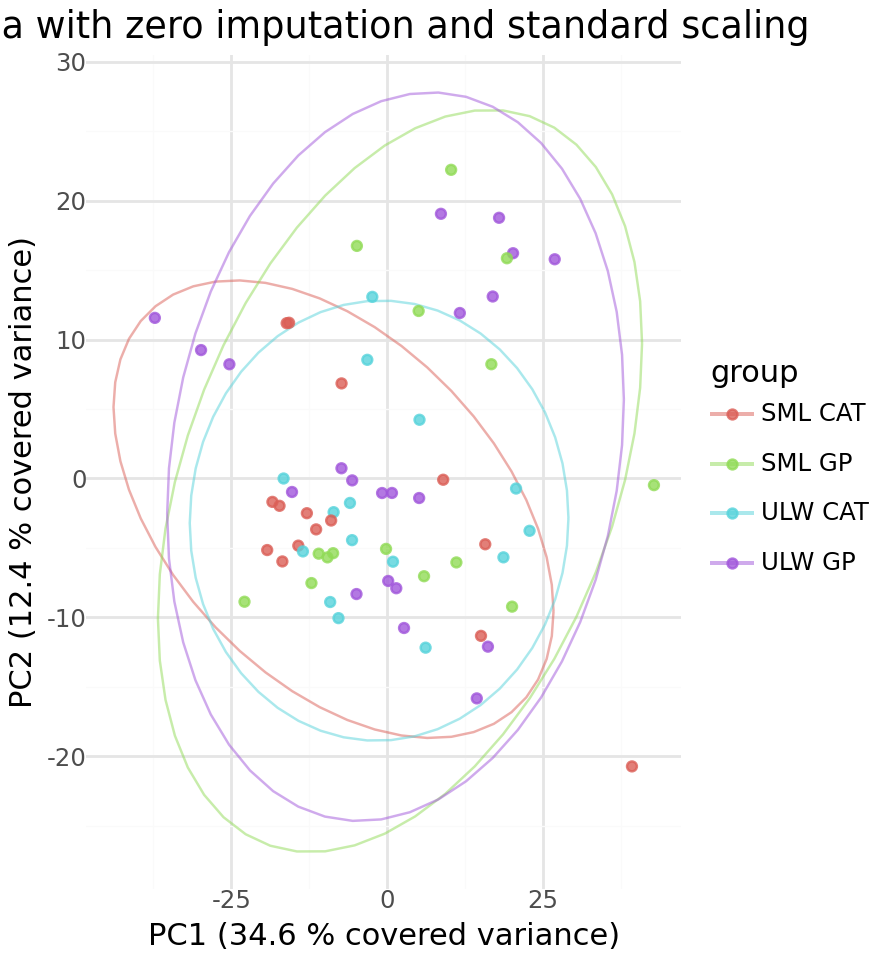

c:\Users\christoph\miniconda3\envs\test123\lib\site-packages\plotnine\ggplot.py:604: PlotnineWarning: Saving 4.4 x 4.8 in image.
c:\Users\christoph\miniconda3\envs\test123\lib\site-packages\plotnine\ggplot.py:605: PlotnineWarning: Filename: ./PCA_seawater.png
INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


In [19]:
p9.options.figure_size = (4.4, 4.8)

p, temp = dartMSAssay.calc_2D_Embedding(imputation="zero", scaling="standard", embedding="pca")
print(p + p9.theme_minimal())
p9.ggsave(p + p9.theme_minimal(), filename = "./PCA_all.png", dpi = 300)

p, temp = dartMSAssay.calc_2D_Embedding(
    imputation="zero", scaling="standard", embedding="pca", keep_groups=["SML CAT", "SML GP", "ULW CAT", "ULW GP"]
)
print(p + p9.theme_minimal())
p9.ggsave(p + p9.theme_minimal(), filename = "./PCA_seawater.png", dpi = 300)


#### LDA

c:\Users\christoph\miniconda3\envs\test123\lib\site-packages\plotnine\stats\stat_ellipse.py:65: PlotnineWarning: Too few points to calculate an ellipse
INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


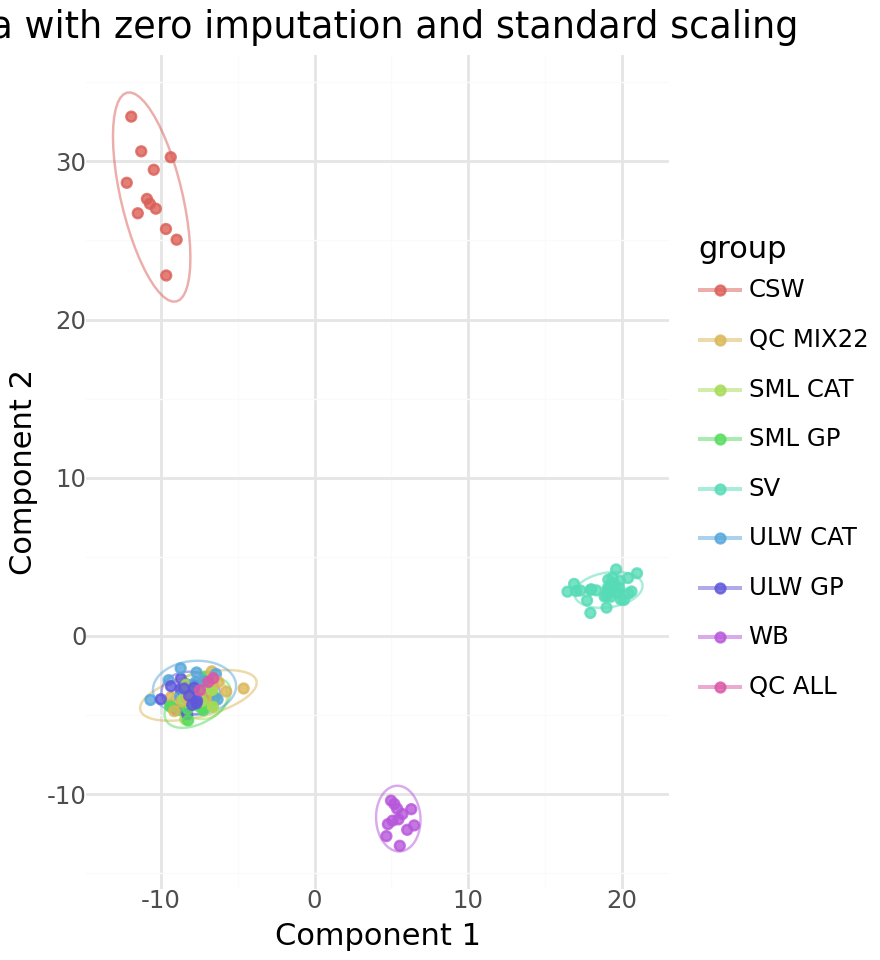

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


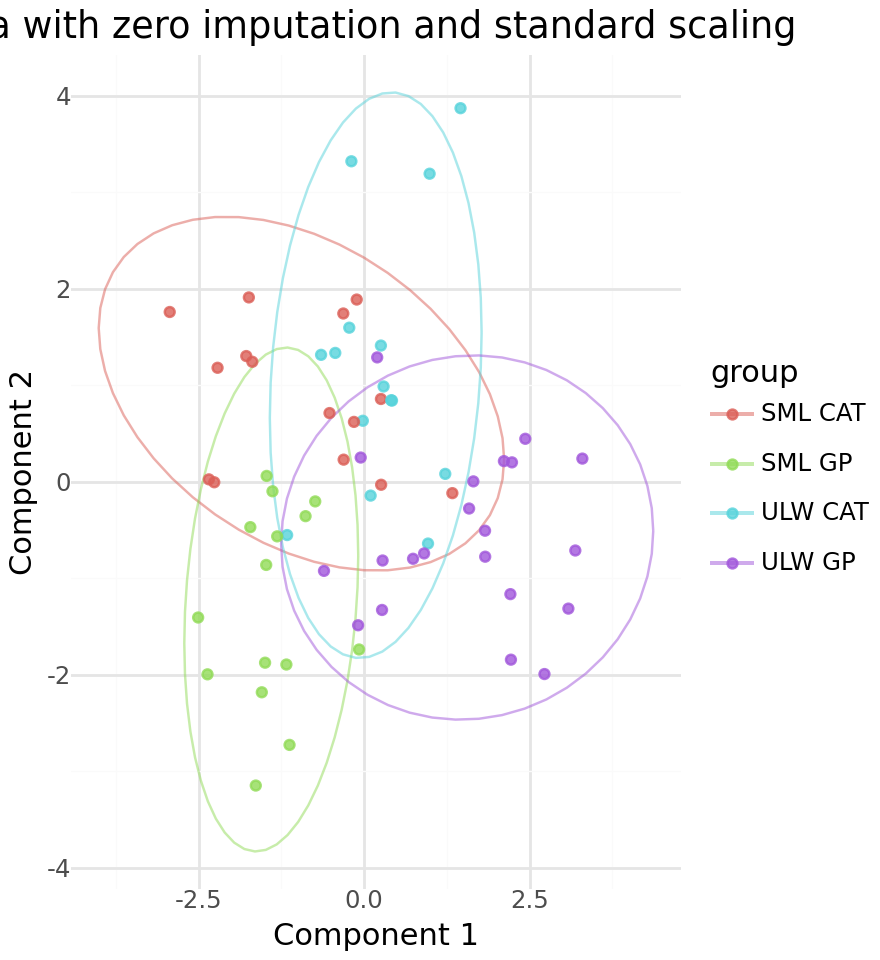

In [20]:


p, temp = dartMSAssay.calc_2D_Embedding(imputation="zero", scaling="standard", embedding="lda")
print(p + p9.theme_minimal())

p, temp = dartMSAssay.calc_2D_Embedding(
    imputation="zero", scaling="standard", embedding="lda", keep_groups=["SML CAT", "SML GP", "ULW CAT", "ULW GP"]
)
print(p + p9.theme_minimal())


#### UMAP

c:\Users\christoph\miniconda3\envs\test123\lib\site-packages\plotnine\stats\stat_ellipse.py:65: PlotnineWarning: Too few points to calculate an ellipse
INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


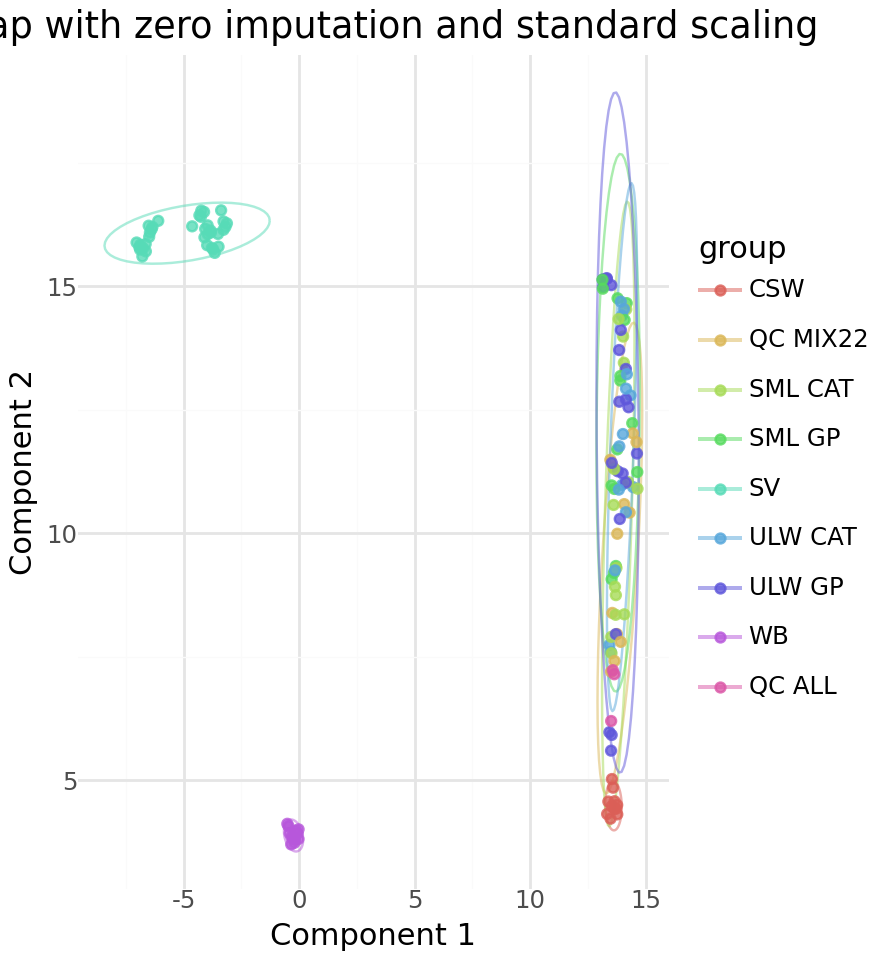

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


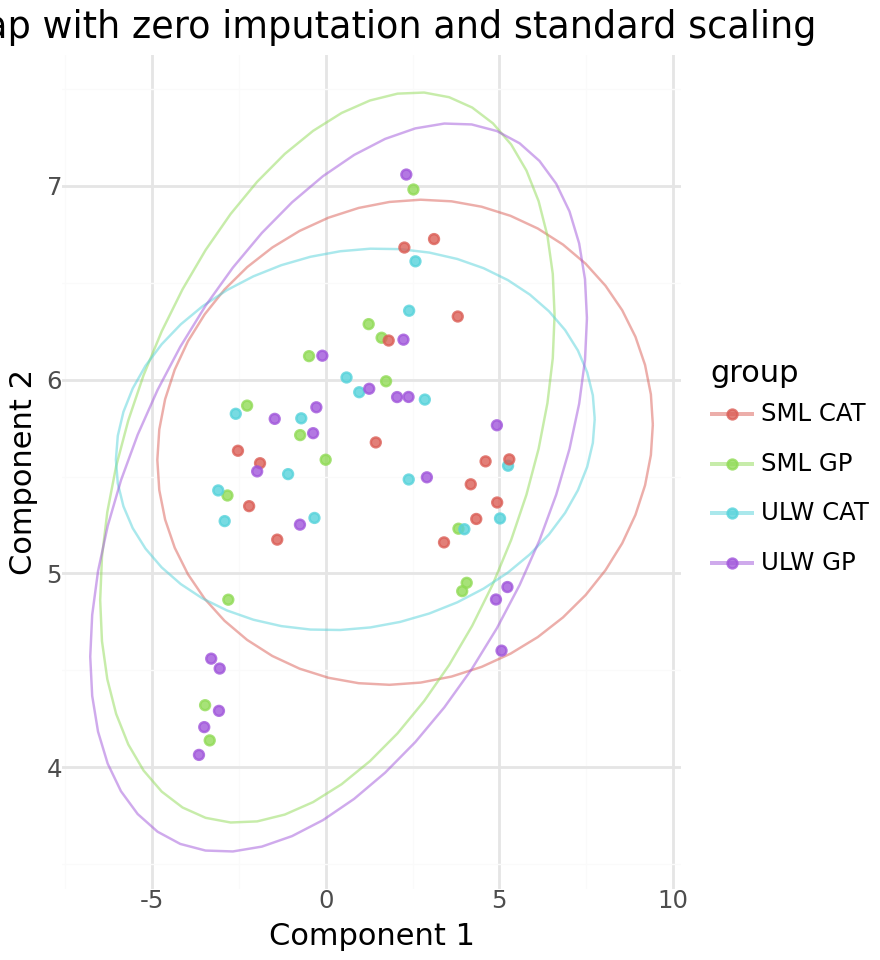

In [21]:
p, temp = dartMSAssay.calc_2D_Embedding(imputation="zero", scaling="standard", embedding="umap")
print(p + p9.theme_minimal())

p, temp = dartMSAssay.calc_2D_Embedding(
    imputation="zero", scaling="standard", embedding="umap", keep_groups=["SML CAT", "SML GP", "ULW CAT", "ULW GP"]
)
print(p + p9.theme_minimal())


INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


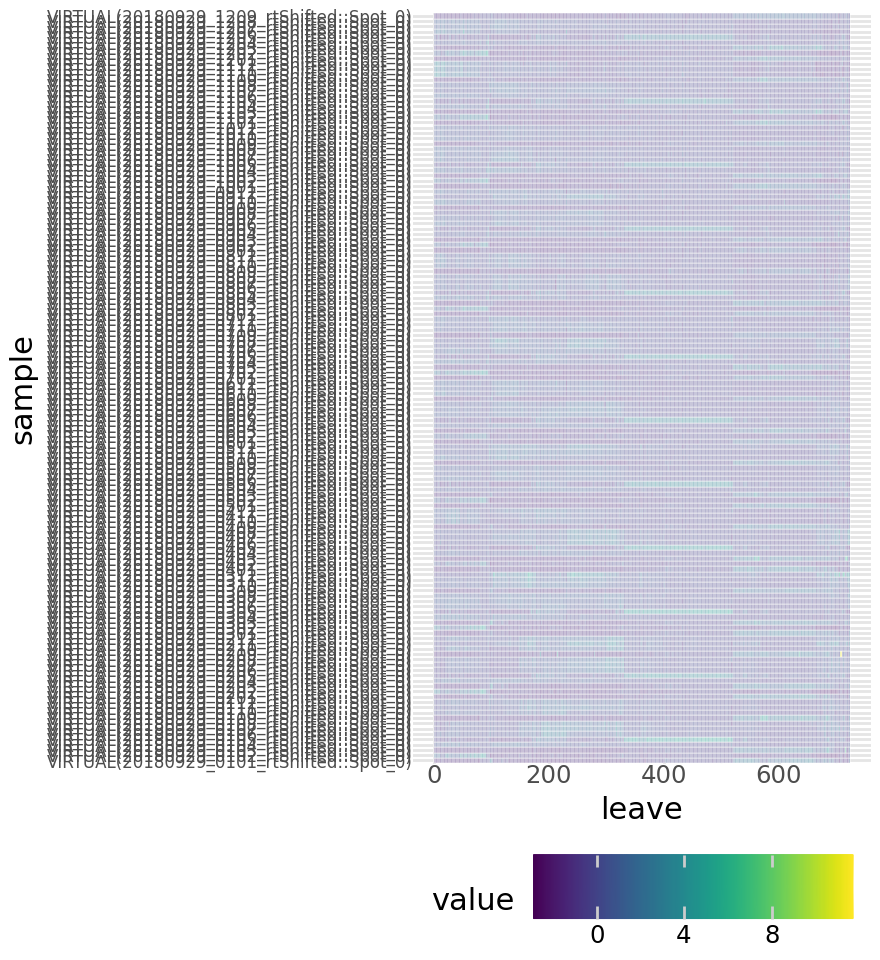

INFO:matplotlib.font_manager:Fontsize 0.00 < 1.0 pt not allowed by FreeType. Setting fontsize = 1 pt


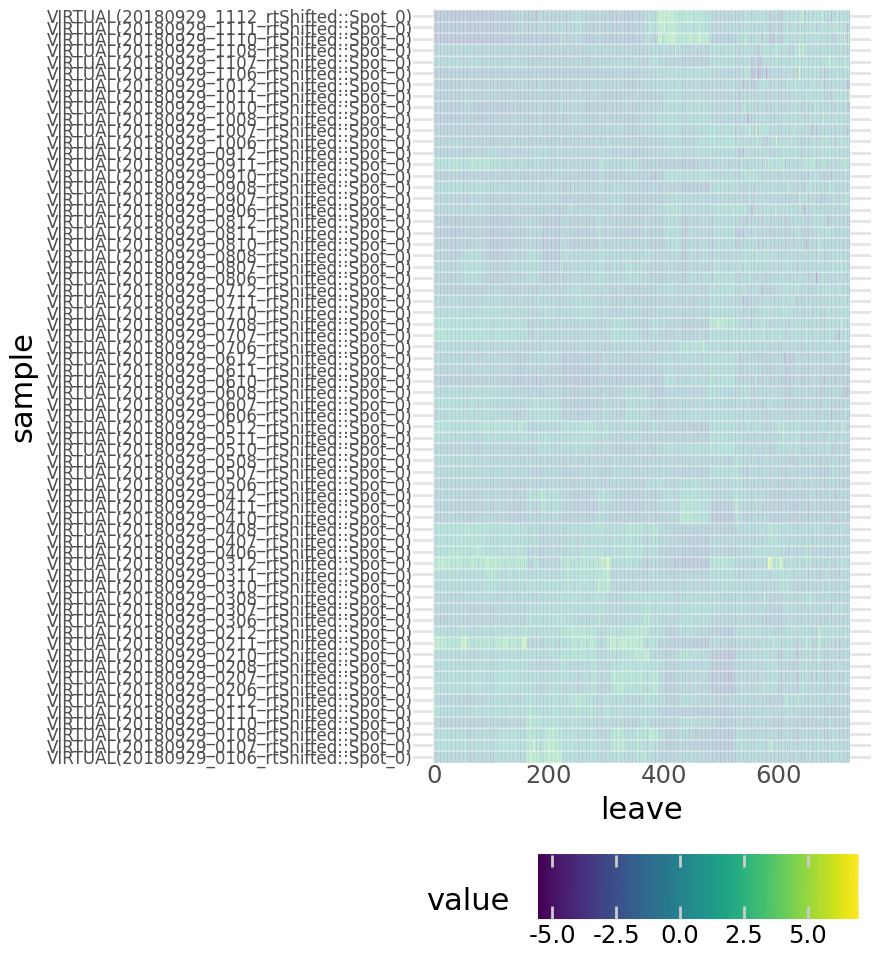

In [22]:
dartMSAssay.plot_heatmap()

dartMSAssay.plot_heatmap(keep_groups=["SML CAT", "SML GP", "ULW CAT", "ULW GP"])


### Export of results 

In [23]:
## export for R
dartMSAssay.export_for_R("./exportedDataMatrix")

## generic use in Python
dat, features, featureAnnotations, samples, groups, batches = dartMSAssay.get_data_matrix_and_meta()


load the data into R with the command 'source('./exportedDataMatrix_import.R')'
## absolute path version: 'source('d:/Projects/test/exportedDataMatrix_import.R')'
